In [1]:
from datetime import datetime

from astropy.io import fits,ascii
from astropy.table import Table,QTable
from astropy.visualization import simple_norm
from astropy.wcs import WCS
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt
import numpy as np
from photutils.aperture import EllipticalAperture
from photutils.isophote import build_ellipse_model,Ellipse,EllipseGeometry

import warnings
warnings.filterwarnings("ignore")

In [2]:
time_ini = datetime.now()

In [3]:
#imported data directories:
data_dir=f'results/morphology/'
cuts_dir_F090W=f'results/make_postage_stamps/F090W/'
cuts_dir_F115W=f'results/make_postage_stamps/F115W/'
cuts_dir_F150W=f'results/make_postage_stamps/F150W/'
cuts_dir_F200W=f'results/make_postage_stamps/F200W/'
cuts_dir_F277W=f'results/make_postage_stamps/F277W/'
cuts_dir_F356W=f'results/make_postage_stamps/F356W/'
cuts_dir_F444W=f'results/make_postage_stamps/F444W/'

#directoy to store results from this notebook:
res_dir=f'results/isophotal_analysis/'

Firstly, we read the table with the data from the 14 galaxies selected from visual classification.

In [4]:
table=data_dir+f'gal_visual_class_list.ecsv'
data_sample = ascii.read(table)

#list of galaxies ID:
gal_list=data_sample['ID']

# Cutouts in all filters from all galaxies

Firstly, we represent each galaxy in all the available filters to discard any unwanted results.

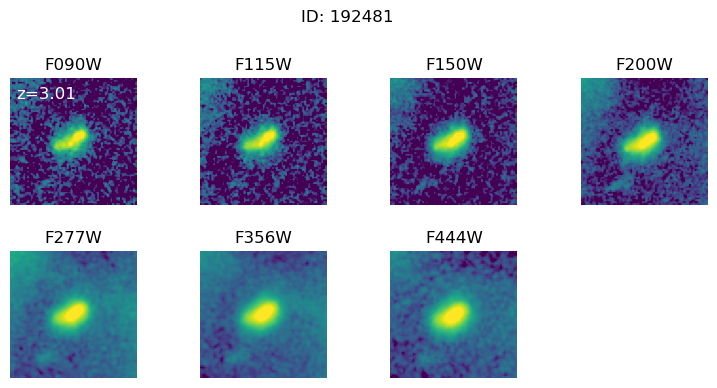

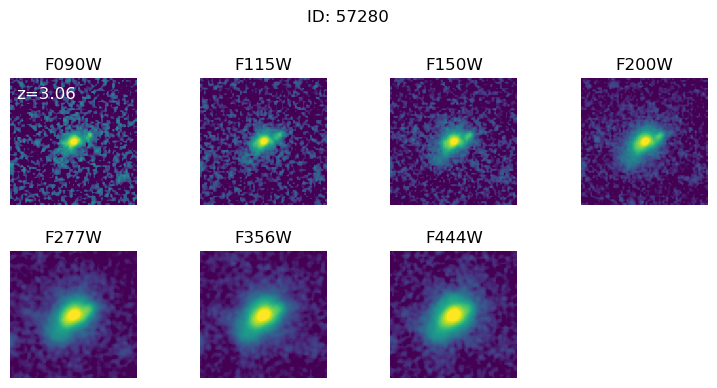

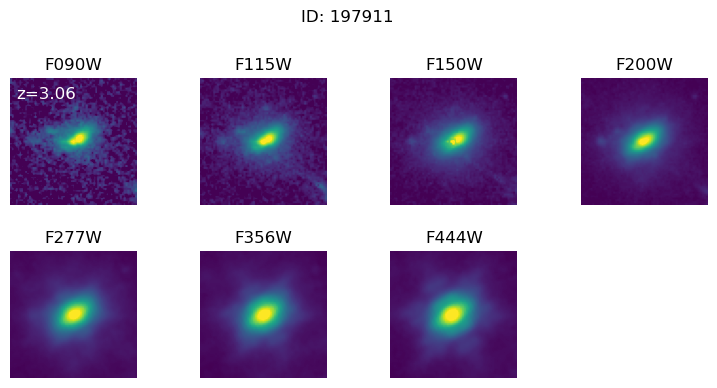

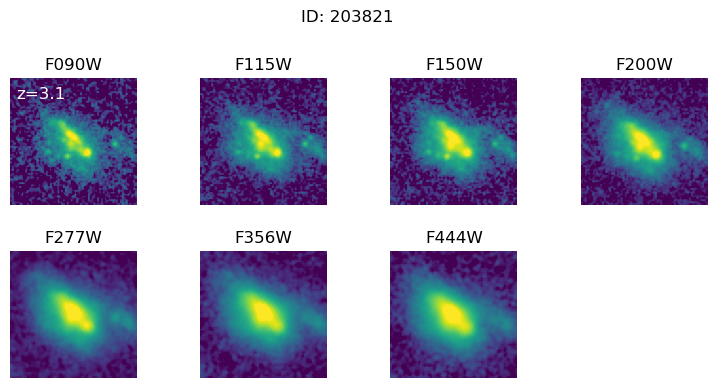

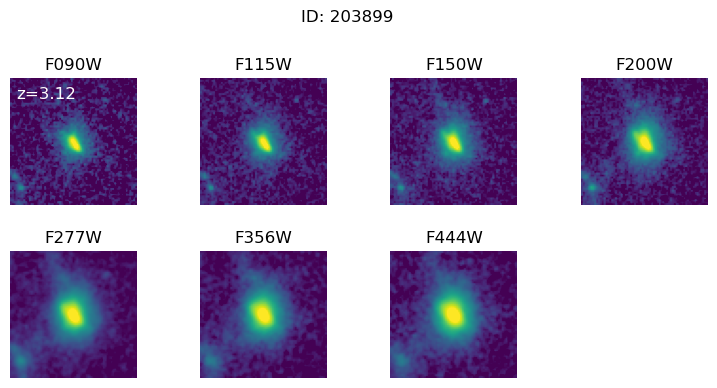

...

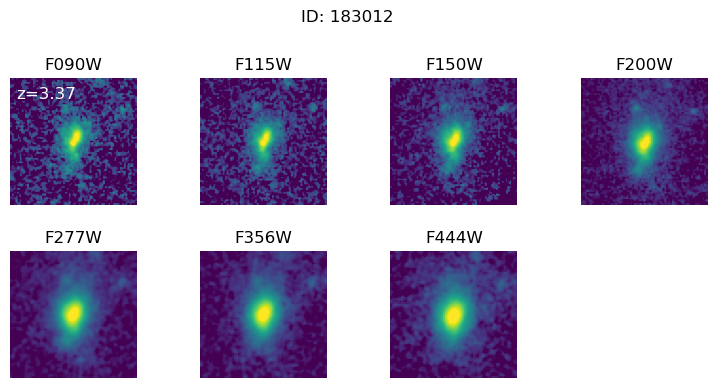

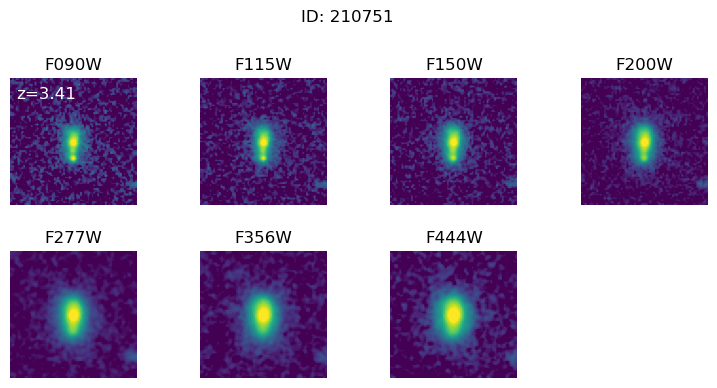

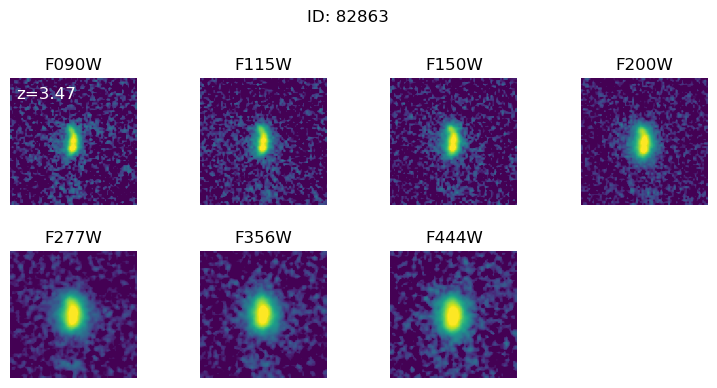

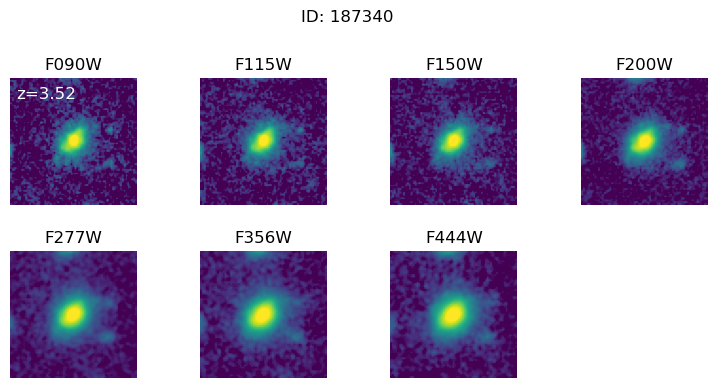

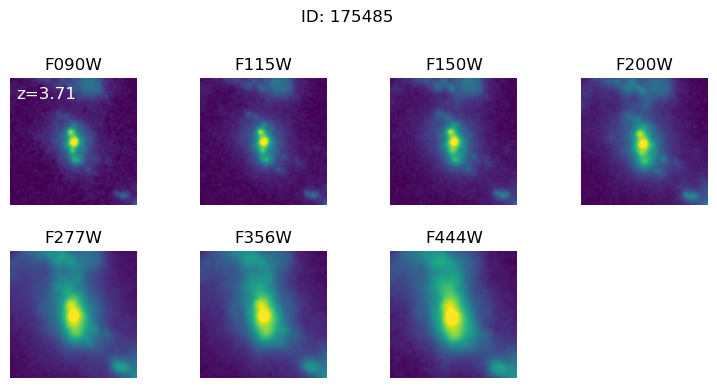

In [5]:
gal_list=data_sample['ID']
i=0

with PdfPages(res_dir+f'cutouts_all_filters.pdf') as pdf:
    for gal in gal_list:

        #galaxy in all filters:
        image_F090W=cuts_dir_F090W+f"{gal}_cutout.fits"
        image_F115W=cuts_dir_F115W+f"{gal}_cutout.fits"
        image_F150W=cuts_dir_F150W+f"{gal}_cutout.fits"
        image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
        image_F277W=cuts_dir_F277W+f"{gal}_cutout.fits"
        image_F356W=cuts_dir_F356W+f"{gal}_cutout.fits"
        image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
        
        hdu_image_F090W=fits.open(image_F090W)
        hdu_image_F115W=fits.open(image_F115W)
        hdu_image_F150W=fits.open(image_F150W)
        hdu_image_F200W=fits.open(image_F200W)
        hdu_image_F277W=fits.open(image_F277W)
        hdu_image_F356W=fits.open(image_F356W)
        hdu_image_F444W=fits.open(image_F444W)
        
        data_F090W=hdu_image_F090W[1].data
        data_F115W=hdu_image_F115W[1].data
        data_F150W=hdu_image_F150W[1].data
        data_F200W=hdu_image_F200W[1].data
        data_F277W=hdu_image_F277W[1].data
        data_F356W=hdu_image_F356W[1].data
        data_F444W=hdu_image_F444W[1].data
        
        #normalization of all images:
        img_max_F090W=0.6*np.max(data_F090W)
        img_max_F115W=0.6*np.max(data_F115W)
        img_max_F150W=0.6*np.max(data_F150W)
        img_max_F200W=0.6*np.max(data_F200W)
        img_max_F277W=0.6*np.max(data_F277W)
        img_max_F356W=0.6*np.max(data_F356W)
        img_max_F444W=0.6*np.max(data_F444W)
        
        norm_F090W = simple_norm(data_F090W, 'log', log_a=70, min_cut=0, max_cut=img_max_F090W)
        norm_F115W = simple_norm(data_F115W, 'log', log_a=70, min_cut=0, max_cut=img_max_F115W)
        norm_F150W = simple_norm(data_F150W, 'log', log_a=70, min_cut=0, max_cut=img_max_F150W)
        norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
        norm_F277W = simple_norm(data_F277W, 'log', log_a=70, min_cut=0, max_cut=img_max_F277W)
        norm_F356W = simple_norm(data_F356W, 'log', log_a=70, min_cut=0, max_cut=img_max_F356W)
        norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
        #plotting:
        fig=plt.figure(figsize=(9, 4.5))
        fig.suptitle(f'ID: {gal}')
        plt.subplots_adjust(hspace=0, wspace=0.5)
        
        plt.subplot(2, 4, 1)
        plt.imshow(data_F090W, origin='lower',norm=norm_F090W)
        plt.title("F090W")
        plt.axis('off')
        z=data_sample['z'][i]
        text_kwargs = dict(ha='left', va='top', fontsize=12, color='white')
        plt.text(3, 62, f'z={z}', **text_kwargs)
        
        plt.subplot(2, 4, 2)
        plt.imshow(data_F115W, origin='lower',norm=norm_F115W)
        plt.title("F115W")
        plt.axis('off')
        
        plt.subplot(2, 4, 3)
        plt.imshow(data_F150W, origin='lower',norm=norm_F150W)
        plt.title("F150W")
        plt.axis('off')

        plt.subplot(2, 4, 4)
        plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
        plt.title("F200W")
        plt.axis('off')

        plt.subplot(2, 4, 5)
        plt.imshow(data_F277W, origin='lower',norm=norm_F277W)
        plt.title("F277W")
        plt.axis('off')

        plt.subplot(2, 4, 6)
        plt.imshow(data_F356W, origin='lower',norm=norm_F356W)
        plt.title("F356W")
        plt.axis('off')
        
        plt.subplot(2, 4, 7)
        plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
        plt.title("F444W")
        plt.axis('off')

        i=i+1
      
        pdf.savefig(bbox_inches="tight")

We discard galaxy 197911 because it's not resolved for bands above F200W:

In [6]:
number_to_remove = 197911
rows_to_keep = data_sample['ID'] != number_to_remove
data_sample = data_sample[rows_to_keep]

# Isophotal analysis:

Isophotal analysis of all galaxies.

Firstly, we have to define a different geometry for each ellipse to be fitted for each galaxy. For a better analysis of whether the fit is correct or not, we represent each fit with galaxy ID.

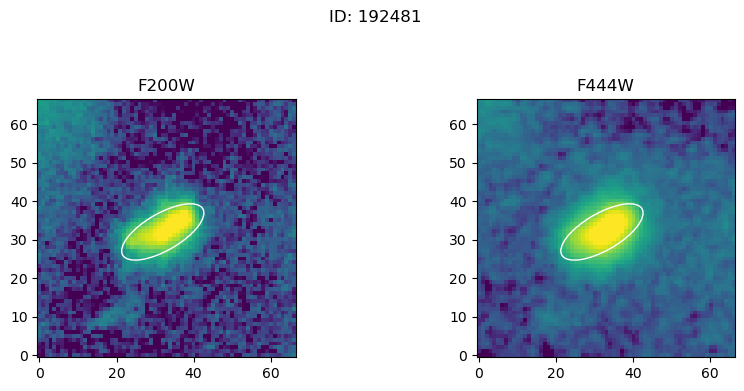

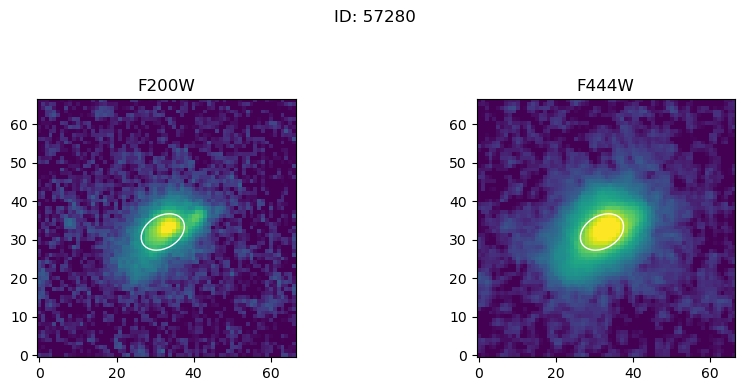

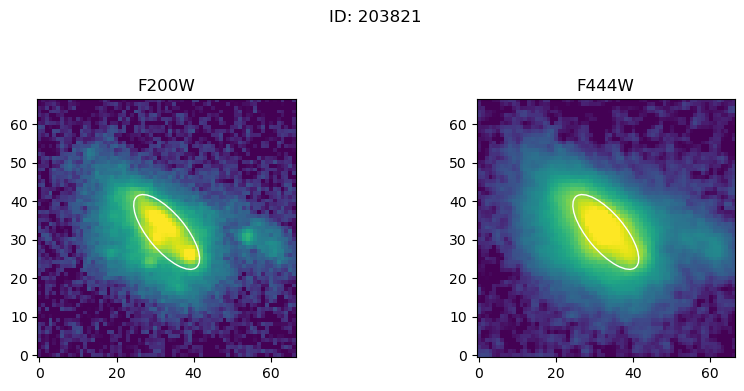

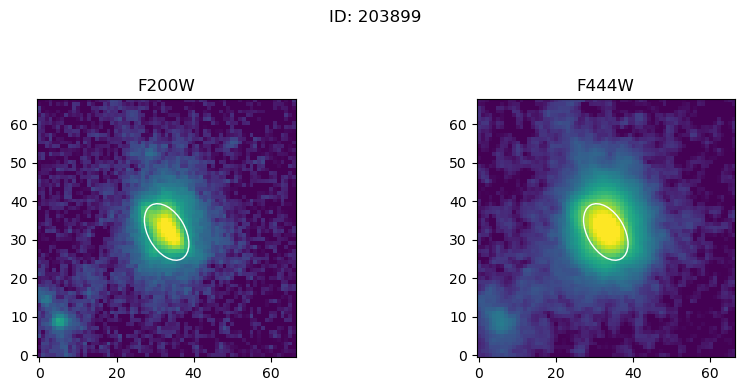

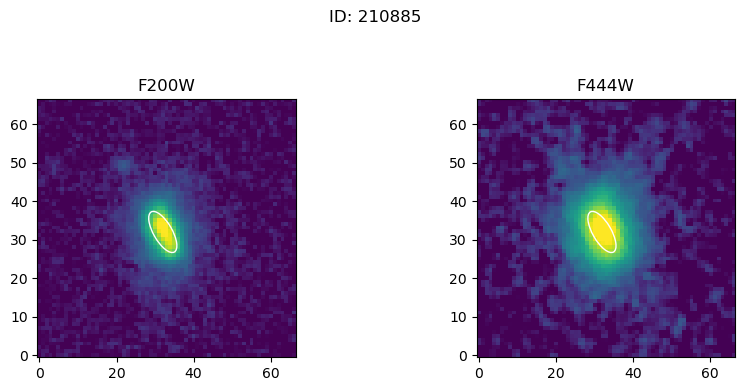

...

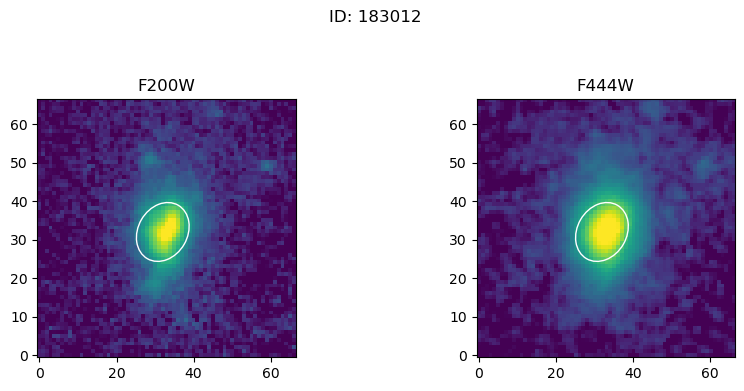

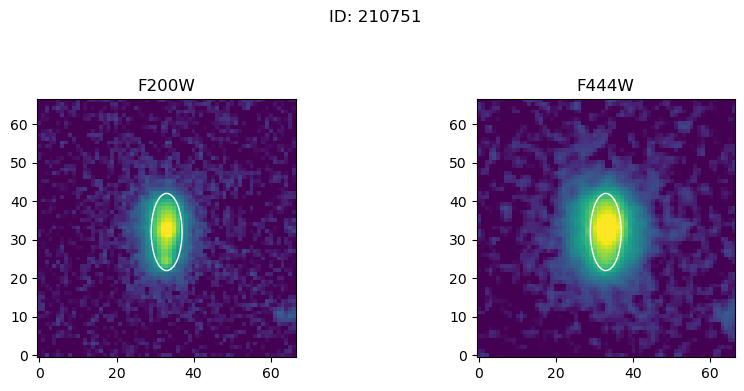

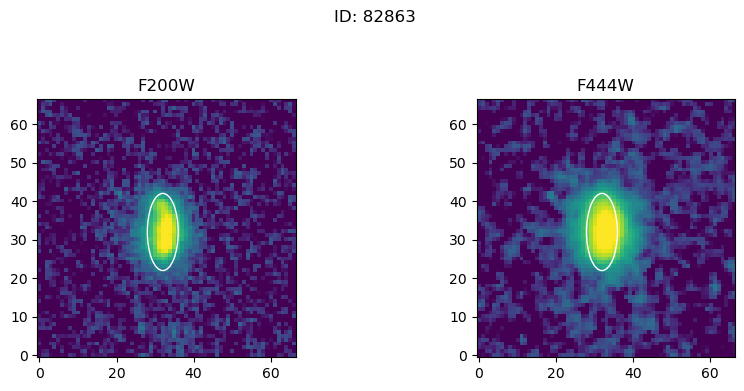

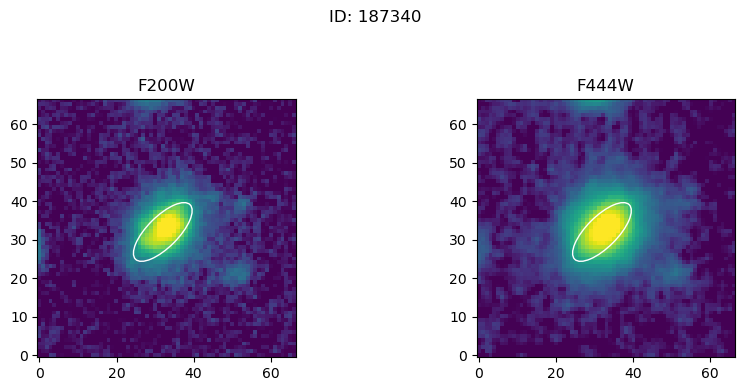

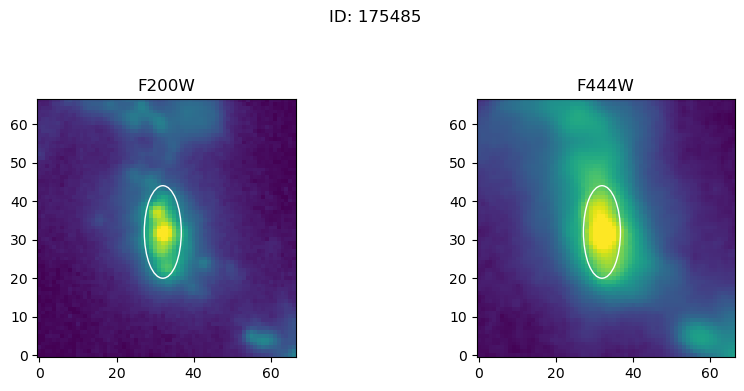

In [7]:
#We provide the elliptical isophote fitter with an initial ellipse to be fitted:
geometry=[]

#1 - ID: 192481
geometry.append(EllipseGeometry(x0=32, y0=32, sma=12, eps=0.6, pa=30.0 * np.pi / 180.0))

#2 - ID: 57280
geometry.append(EllipseGeometry(x0=32, y0=32, sma=6, eps=0.3, pa=30.0 * np.pi / 180.0))

#3 - ID: 203821
geometry.append(EllipseGeometry(x0=33, y0=32, sma=12, eps=0.6, pa=130.0 * np.pi / 180.0))

#4 - ID: 203899
geometry.append(EllipseGeometry(x0=33, y0=32, sma=8, eps=0.4, pa=120.0 * np.pi / 180.0))

#5 - ID: 210885
geometry.append(EllipseGeometry(x0=32, y0=32, sma=6, eps=0.6, pa=120.0 * np.pi / 180.0))

#6 - ID: 155468
geometry.append(EllipseGeometry(x0=33, y0=32, sma=8, eps=0.6, pa=90.0 * np.pi / 180.0))

#7 - ID: 182126
geometry.append(EllipseGeometry(x0=32, y0=32, sma=14, eps=0.7, pa=140.0 * np.pi / 180.0))

#8 - ID: 171816
geometry.append(EllipseGeometry(x0=32, y0=32, sma=10, eps=0.6, pa=150.0 * np.pi / 180.0))

#9 - ID: 183012
geometry.append(EllipseGeometry(x0=32, y0=32, sma=8, eps=0.2, pa=60.0 * np.pi / 180.0))

#10 - ID: 210751
geometry.append(EllipseGeometry(x0=33, y0=32, sma=10, eps=0.6, pa=90.0 * np.pi / 180.0))

#11 - ID: 82863
geometry.append(EllipseGeometry(x0=32, y0=32, sma=10, eps=0.6, pa=90.0 * np.pi / 180.0))

#12 - ID: 187340
geometry.append(EllipseGeometry(x0=32, y0=32, sma=10, eps=0.6, pa=45.0 * np.pi / 180.0))

#13 - ID: 175485
geometry.append(EllipseGeometry(x0=32, y0=32, sma=12, eps=0.6, pa=90.0 * np.pi / 180.0))

#representation:
gal_list=data_sample['ID']
i=0

for gal in gal_list:
    
    #galaxy in both filters:
    image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
    image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
    hdu_image_F200W=fits.open(image_F200W)
    hdu_image_F444W=fits.open(image_F444W)
    data_F200W=hdu_image_F200W[1].data
    data_F444W=hdu_image_F444W[1].data

    #aperture for both filters:
    aper = EllipticalAperture((geometry[i].x0, geometry[i].y0), geometry[i].sma, 
            geometry[i].sma*(1-geometry[i].eps),geometry[i].pa)

    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 4.5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    aper.plot(color='white')

    i=i+1

plt.show()

The first fit will be done only in filter F444W and will allow us to determine the center of the ellipse.

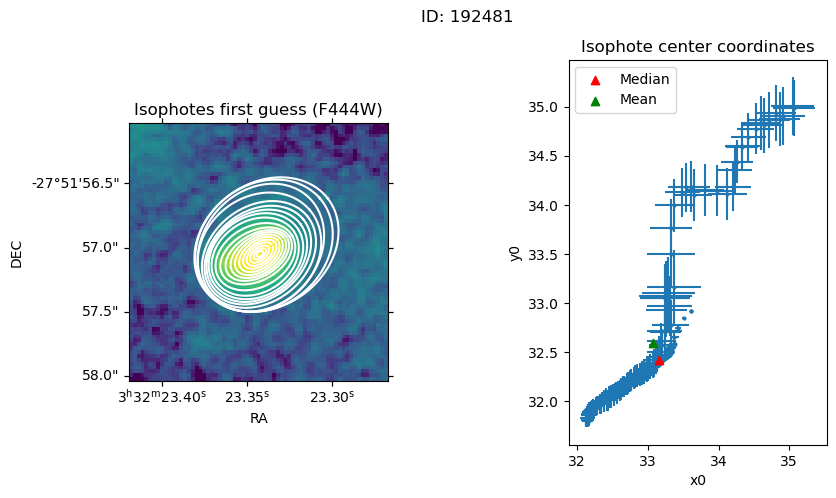

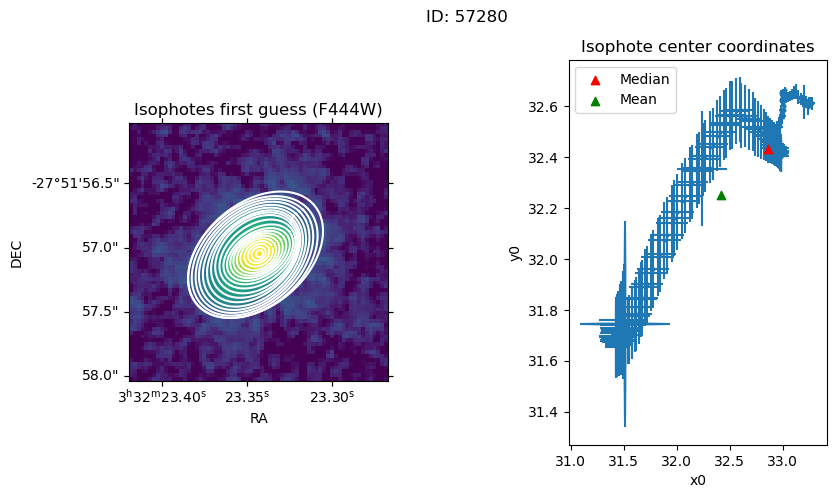

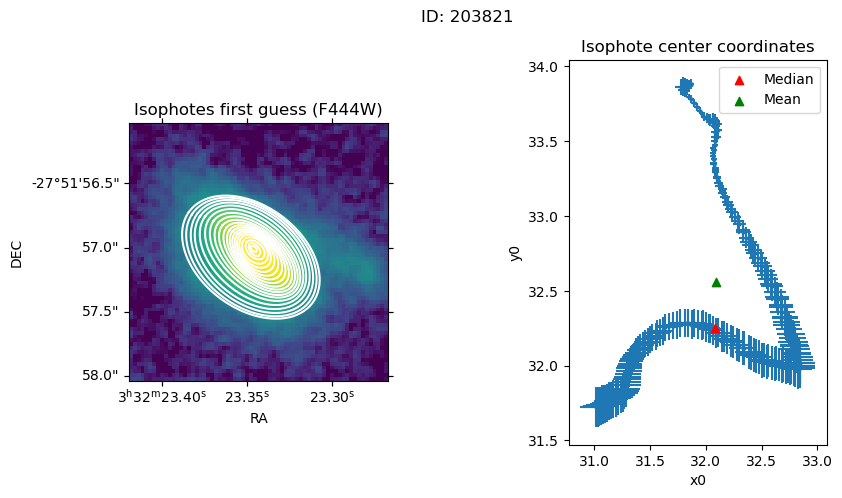

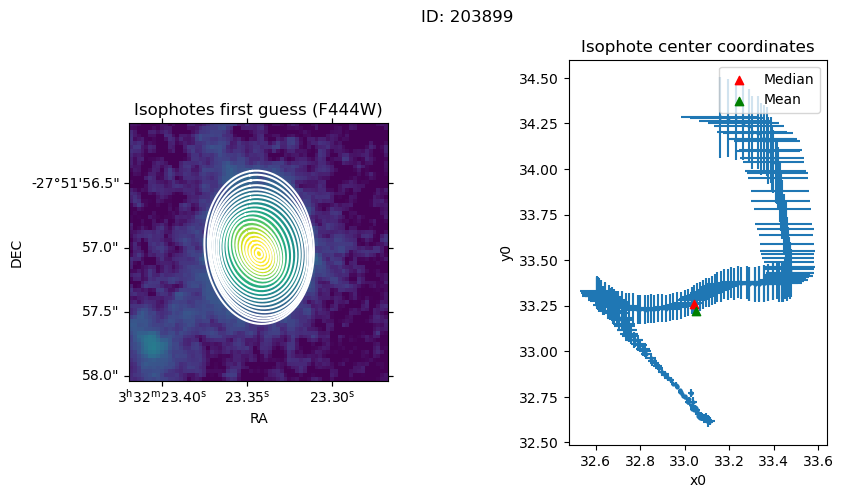

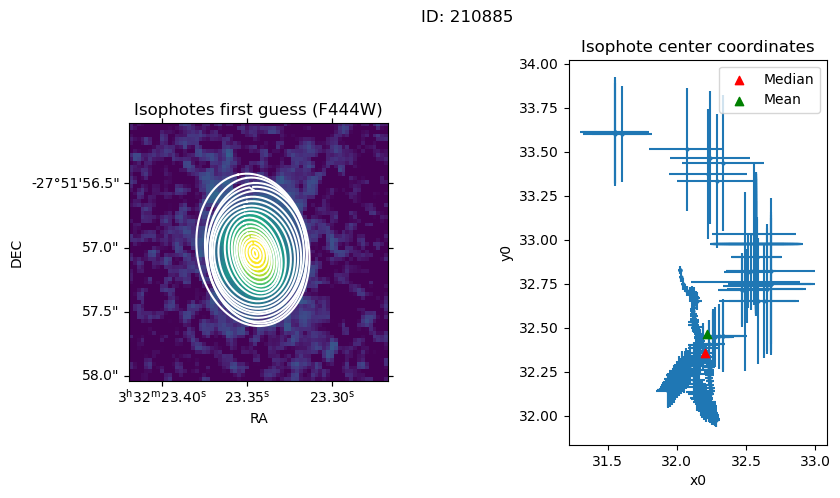

...

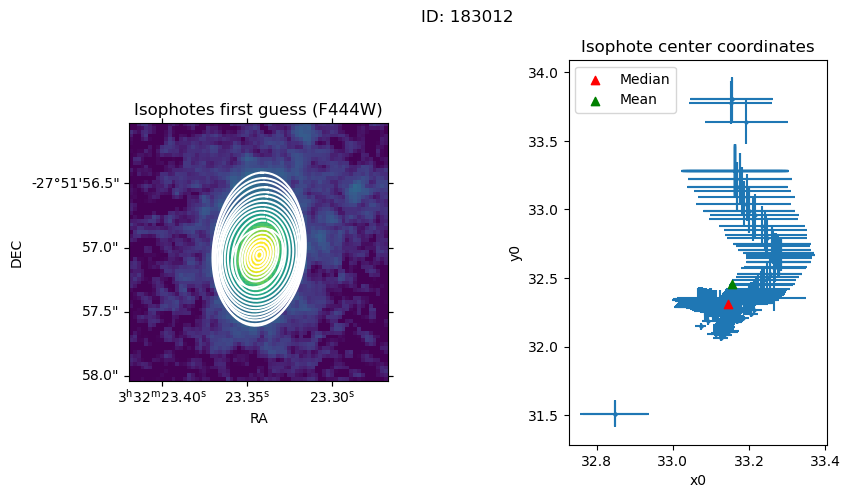

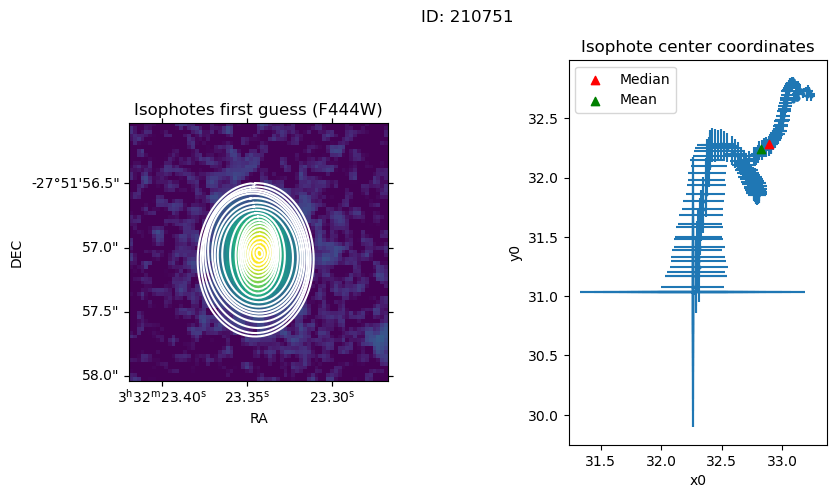

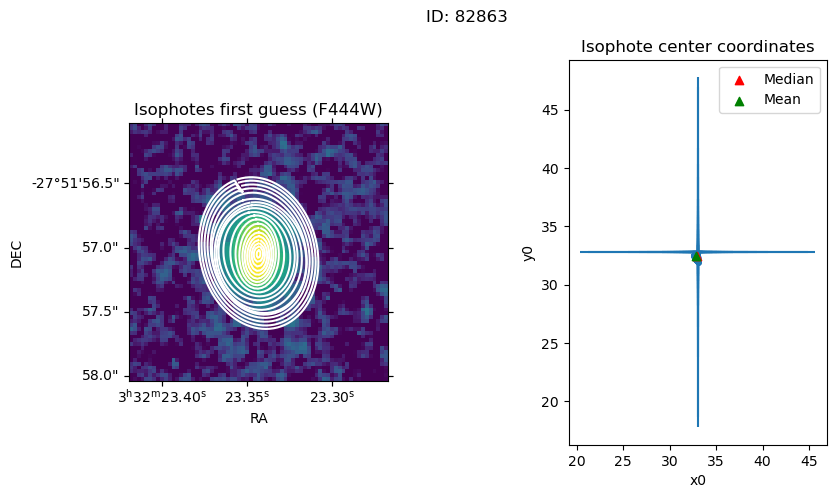

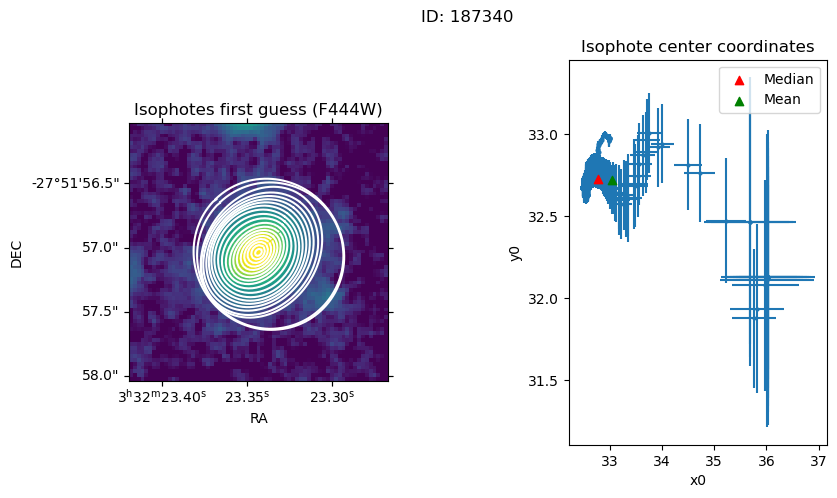

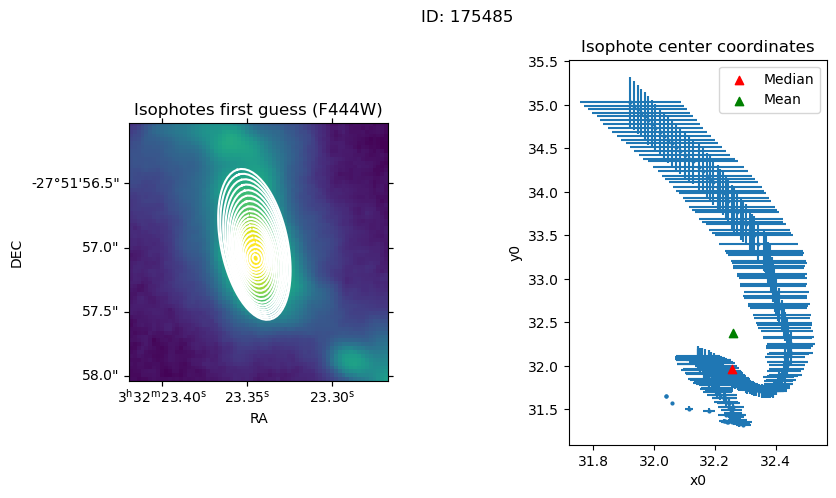

In [9]:
i=0
x0=[]
y0=[]

with PdfPages(res_dir+f'ellipse_center_guess_v1.pdf') as pdf:
    
    for gal in gal_list:
        
        #galaxy in both filters:
        image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
        hdu_image_F444W=fits.open(image_F444W)
        data_F444W=hdu_image_F444W[1].data
        
        #coordinates for the image:
        coord=WCS(hdu_image_F200W[1].header)
        
        #Plotting the initial ellipse guess:
        
        #aperture for both filters:
        aper = EllipticalAperture((geometry[i].x0, geometry[i].y0), geometry[i].sma, 
                                  geometry[i].sma*(1-geometry[i].eps),geometry[i].pa)
        
        #normalization of both images:
        img_max_F444W=0.6*np.max(data_F444W)
        norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)

        #ellipse fit:
        ellipse_F444W = Ellipse(data_F444W, geometry[i])
        isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True, maxsma=20)
        ##fix_center is False because we're analyzing how it changes to find the best center
        x0.append(np.median(isolist_F444W.x0))
        y0.append(np.median(isolist_F444W.y0))
        
        #plotting:
        fig=plt.figure(figsize=(9, 5))
        fig.suptitle(f'ID: {gal}')
        plt.subplots_adjust(hspace=0, wspace=0.7)
        
        plt.subplot(1, 2, 1, projection=coord)
        plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
        plt.title("Isophotes first guess (F444W)")
        plt.xlabel('RA')
        plt.ylabel('DEC')
        smas = np.linspace(1, 20, 20)
        for sma in smas:
            iso_F444W = isolist_F444W.get_closest(sma)
            x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
            plt.plot(x_F444W, y_F444W, color='white')

        plt.subplot(1, 2, 2)
        plt.errorbar(isolist_F444W.x0, isolist_F444W.y0, xerr=isolist_F444W.x0_err, 
                     yerr=isolist_F444W.y0_err,fmt='o', markersize=2)
        plt.scatter(np.median(isolist_F444W.x0), np.median(isolist_F444W.y0), color='r', marker='^',
                    label="Median", zorder=10)
        plt.scatter(np.mean(isolist_F444W.x0), np.mean(isolist_F444W.y0), color='g', marker='^', 
                    label="Mean", zorder=10)
        plt.xlabel('x0')
        plt.ylabel('y0')
        plt.title("Isophote center coordinates")
        plt.legend()

        i=i+1
        
        pdf.savefig(bbox_inches="tight")

The ellipses above that are fitted all have the same maximum semimajor axis of 20 pixels. All 20 ellipses from 1px to 20px of sma length are plotted on the image; so it's easy to adjust the max sma value for each galaxy in order to stop this initial fitting before the isophotes are affected by light from other sources. 

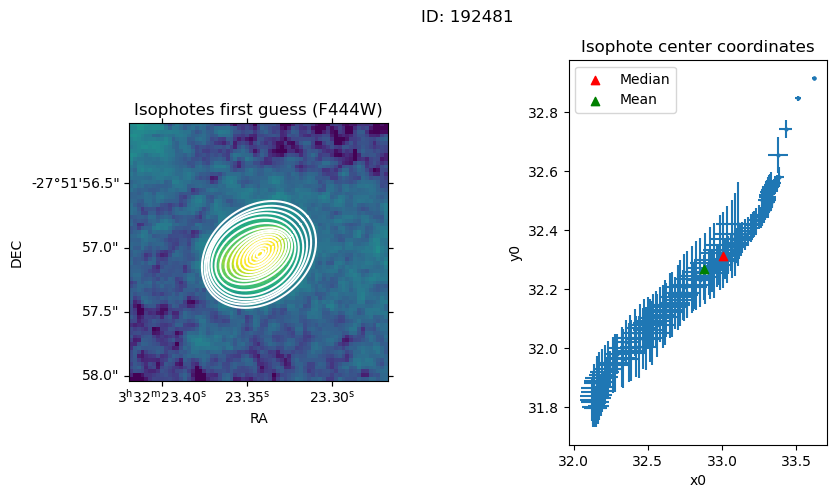

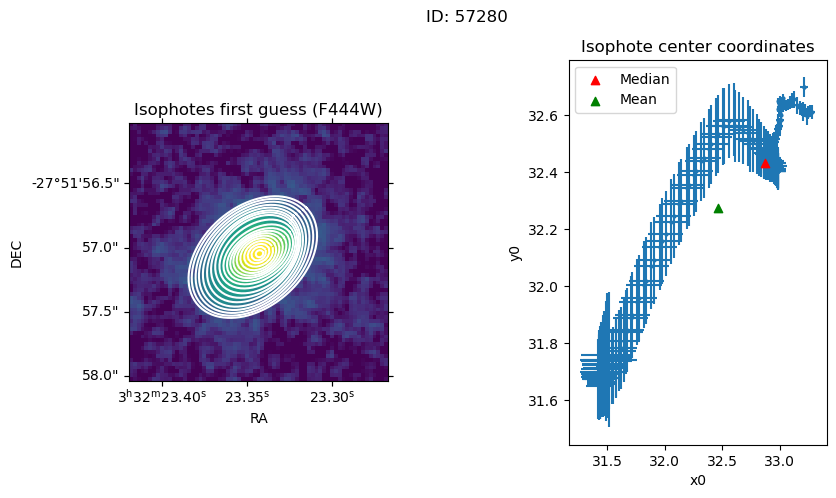

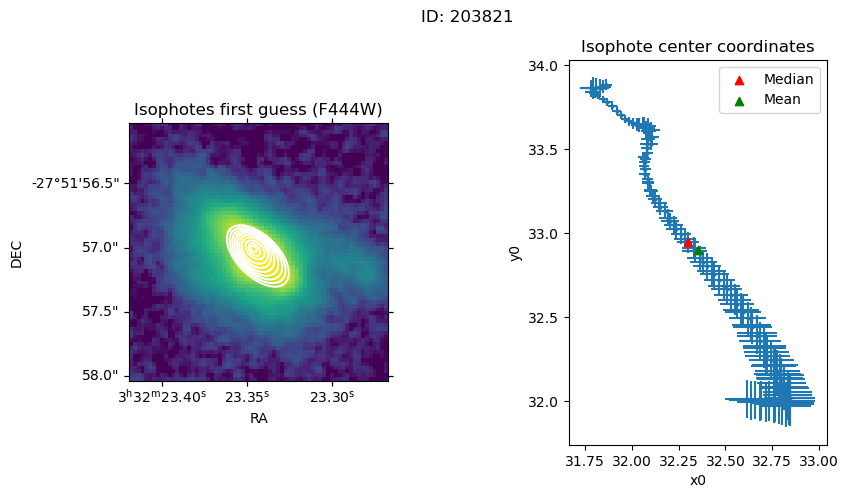

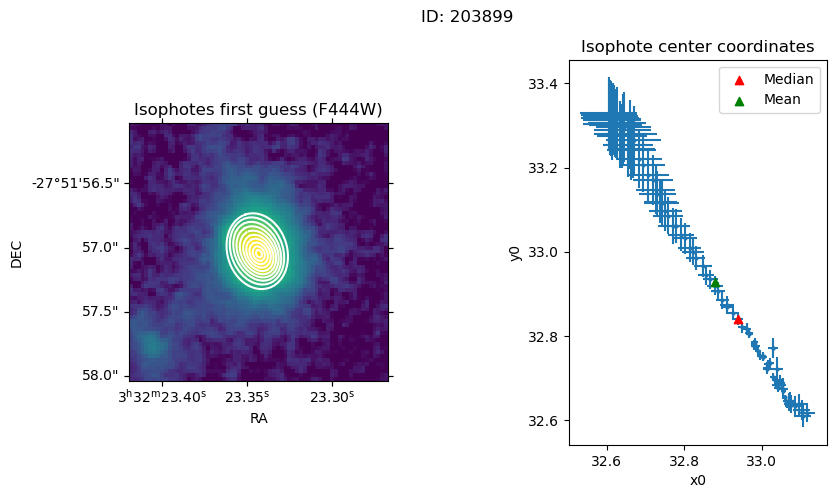

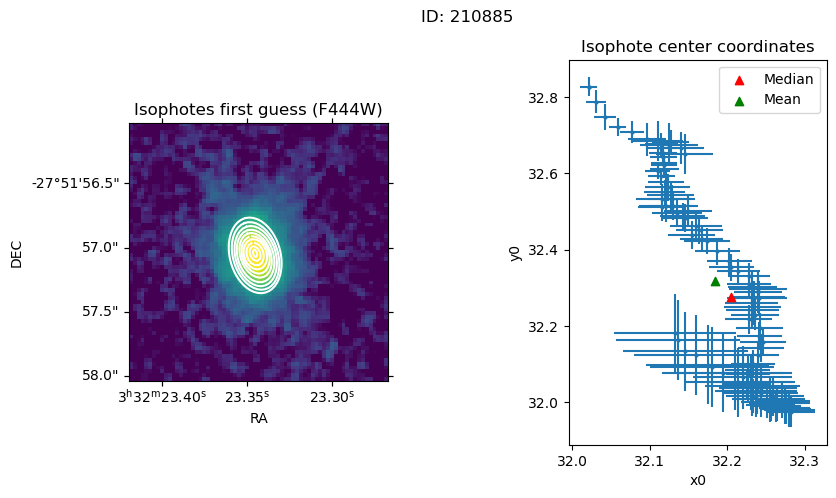

...

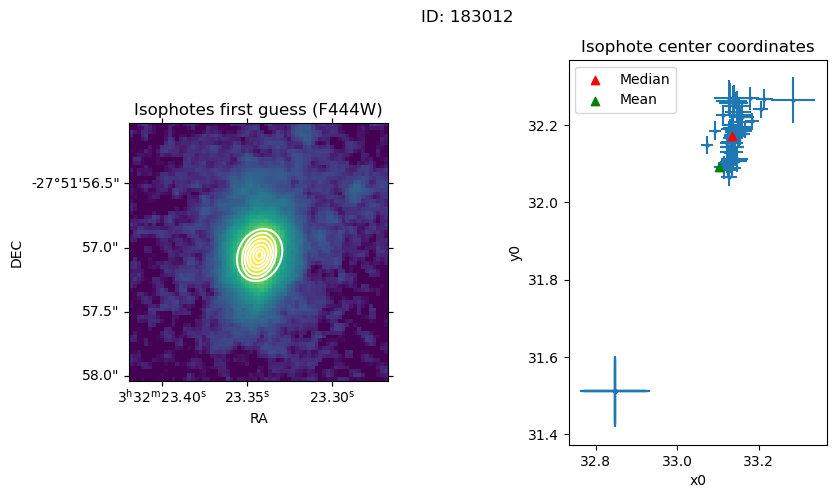

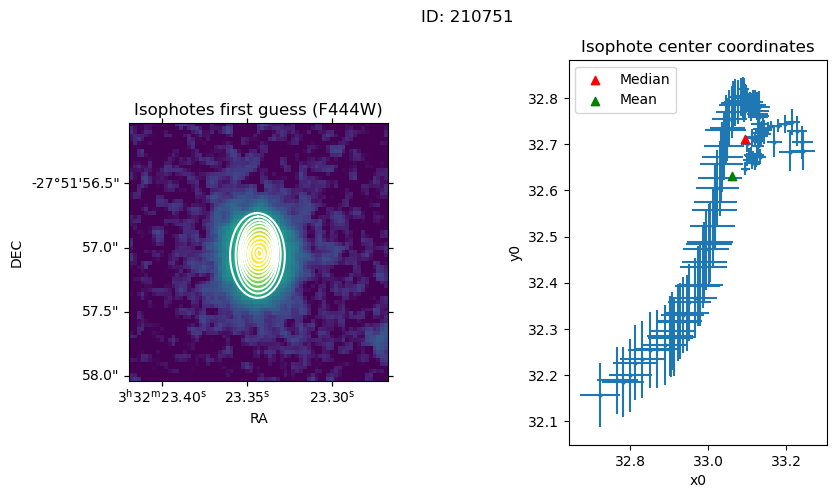

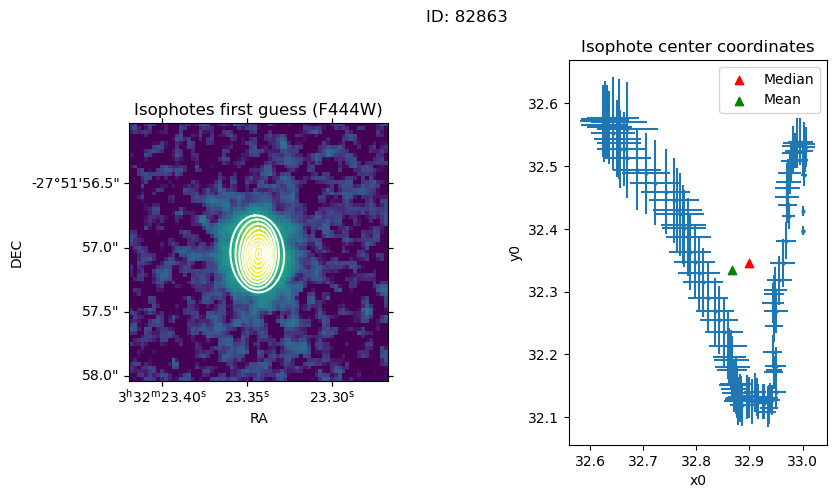

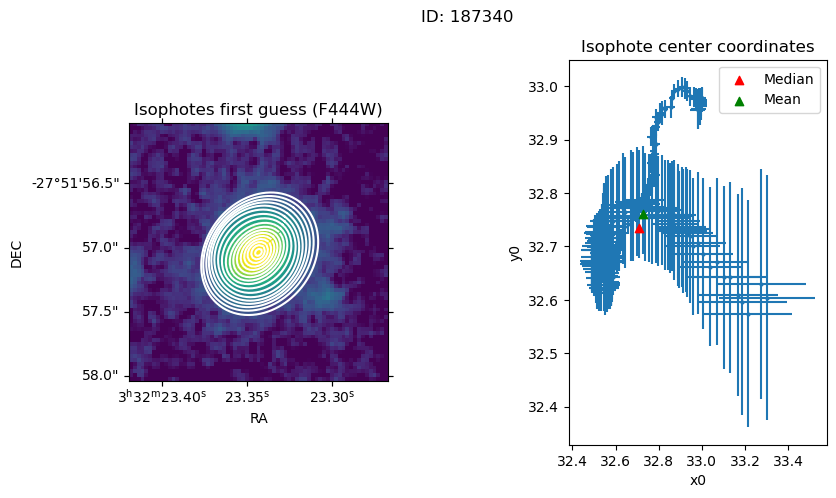

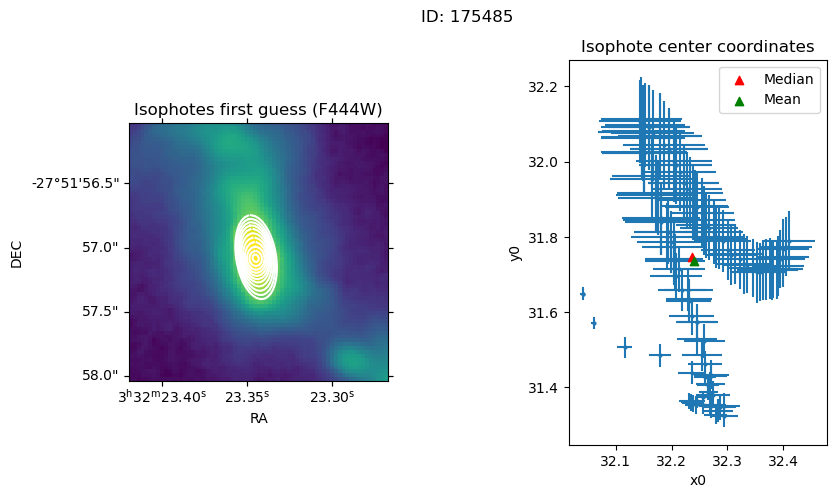

In [11]:
maxsma_list=[]

#1 - ID: 192481
maxsma_list.append(16)

#2 - ID: 57280
maxsma_list.append(19)

#3 - ID: 203821
maxsma_list.append(10)

#4 - ID: 203899
maxsma_list.append(10)

#5 - ID: 210885
maxsma_list.append(10)

#6 - ID: 155468
maxsma_list.append(13)

#7 - ID: 182126
maxsma_list.append(17)

#8 - ID: 171816
maxsma_list.append(12)

#9 - ID: 183012
maxsma_list.append(7)

#10 - ID: 210751
maxsma_list.append(11)

#11 - ID: 82863
maxsma_list.append(10)

#12 - ID: 187340
maxsma_list.append(17)

#13 - ID: 175485
maxsma_list.append(11)

i=0
x0=[]
y0=[]

with PdfPages(res_dir+f'ellipse_center_guess_v2.pdf') as pdf:
    
    for gal in gal_list:
        
        #galaxy in both filters:
        image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
        hdu_image_F444W=fits.open(image_F444W)
        data_F444W=hdu_image_F444W[1].data
        
        #coordinates for the image:
        coord=WCS(hdu_image_F200W[1].header)
        
        #Plotting the initial ellipse guess:
        
        #aperture for both filters:
        aper = EllipticalAperture((geometry[i].x0, geometry[i].y0), geometry[i].sma, 
                                  geometry[i].sma*(1-geometry[i].eps),geometry[i].pa)
        
        #normalization of both images:
        img_max_F444W=0.6*np.max(data_F444W)
        norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)

        #ellipse fit:
        ellipse_F444W = Ellipse(data_F444W, geometry[i])
        isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True, maxsma=maxsma_list[i])
        ##fix_center is False because we're analyzing how it changes to find the best center
        x0.append(np.median(isolist_F444W.x0))
        y0.append(np.median(isolist_F444W.y0))
        
        #plotting:
        fig=plt.figure(figsize=(9, 5))
        fig.suptitle(f'ID: {gal}')
        plt.subplots_adjust(hspace=0, wspace=0.7)
        
        plt.subplot(1, 2, 1, projection=coord)
        plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
        plt.title("Isophotes first guess (F444W)")
        plt.xlabel('RA')
        plt.ylabel('DEC')
        smas = np.linspace(1, maxsma_list[i], maxsma_list[i])
        for sma in smas:
            iso_F444W = isolist_F444W.get_closest(sma)
            x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
            plt.plot(x_F444W, y_F444W, color='white')

        plt.subplot(1, 2, 2)
        plt.errorbar(isolist_F444W.x0, isolist_F444W.y0, xerr=isolist_F444W.x0_err, 
                     yerr=isolist_F444W.y0_err,fmt='o', markersize=2)
        plt.scatter(np.median(isolist_F444W.x0), np.median(isolist_F444W.y0), color='r', marker='^',
                    label="Median", zorder=10)
        plt.scatter(np.mean(isolist_F444W.x0), np.mean(isolist_F444W.y0), color='g', marker='^', 
                    label="Mean", zorder=10)
        plt.xlabel('x0')
        plt.ylabel('y0')
        plt.title("Isophote center coordinates")
        plt.legend()

        i=i+1
        
        pdf.savefig(bbox_inches="tight")

# Fit for each galaxy:

We must fit each galaxy individually because each needs different parameters.

## 1 - ID: 192481

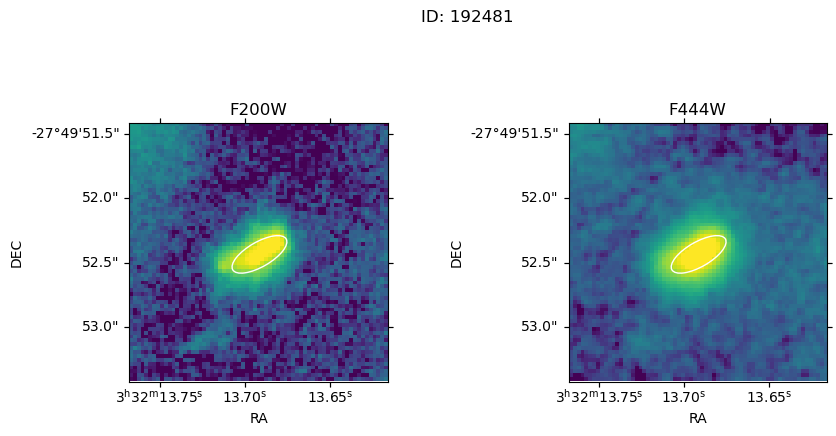

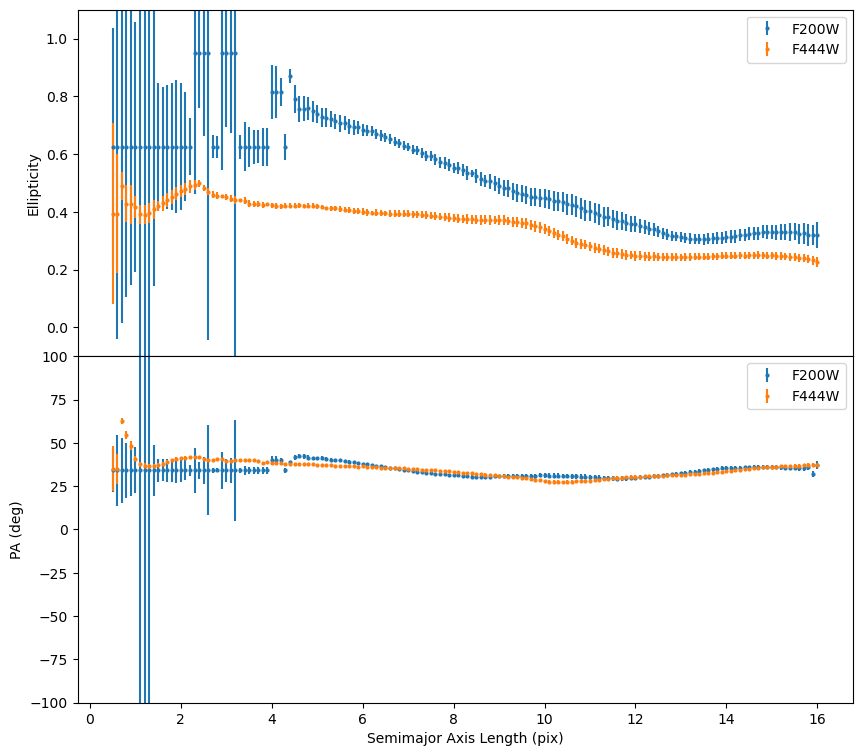

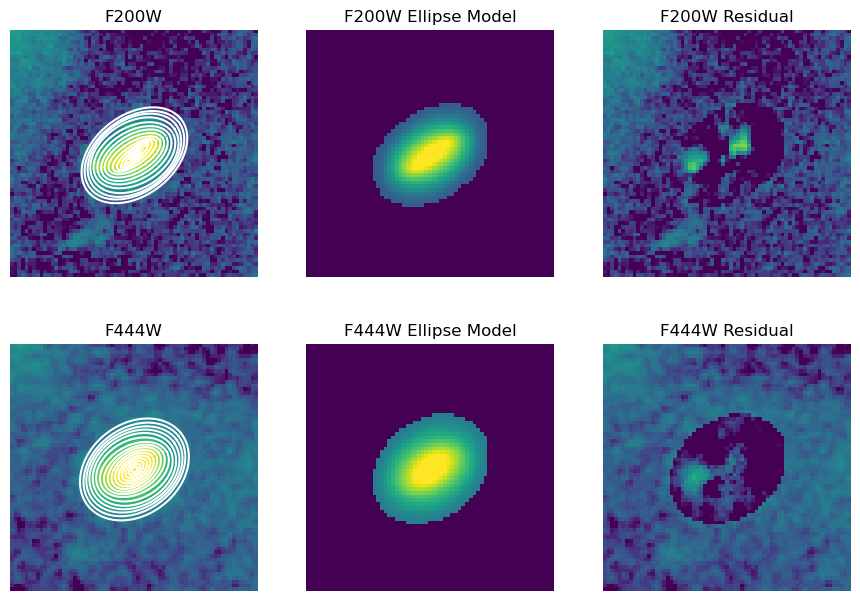

In [16]:
gal=gal_list[0]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[0].x0, geometry[0].y0), geometry[0].sma, 
                          geometry[0].sma*(1-geometry[0].eps),geometry[0].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[0])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.median(isolist_F444W.x0), y0=np.median(isolist_F444W.y0), sma=8, eps=0.6, 
                         pa=30.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, 
                              geometry_2.sma*(1-geometry_2.eps), geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=16, 
                                            conver=0.5, maxgerr=0.95, step=0.1, sma0=7)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=16, 
                                            conver=0.5, maxgerr=0.95, step=0.1, sma0=7)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(-100,100)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 16, 16)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 16, 16)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

## 2 - ID: 57280

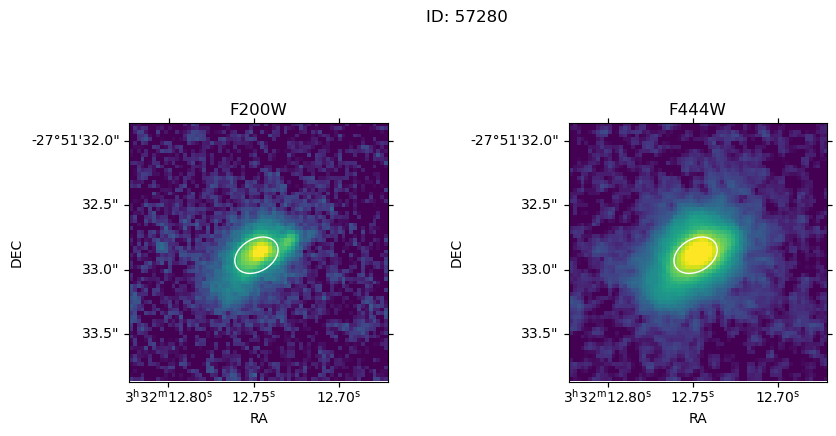

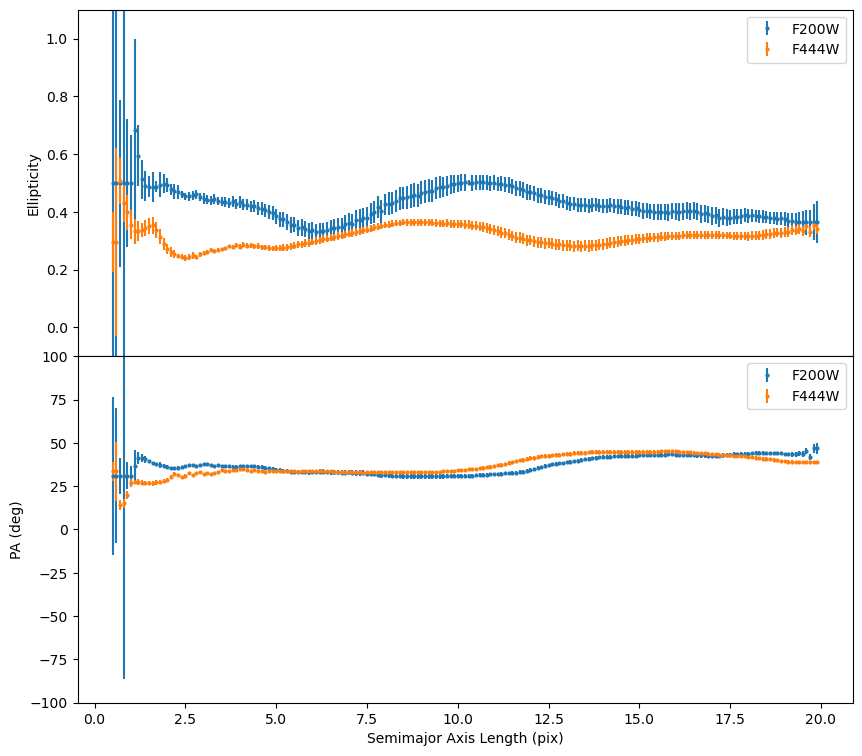

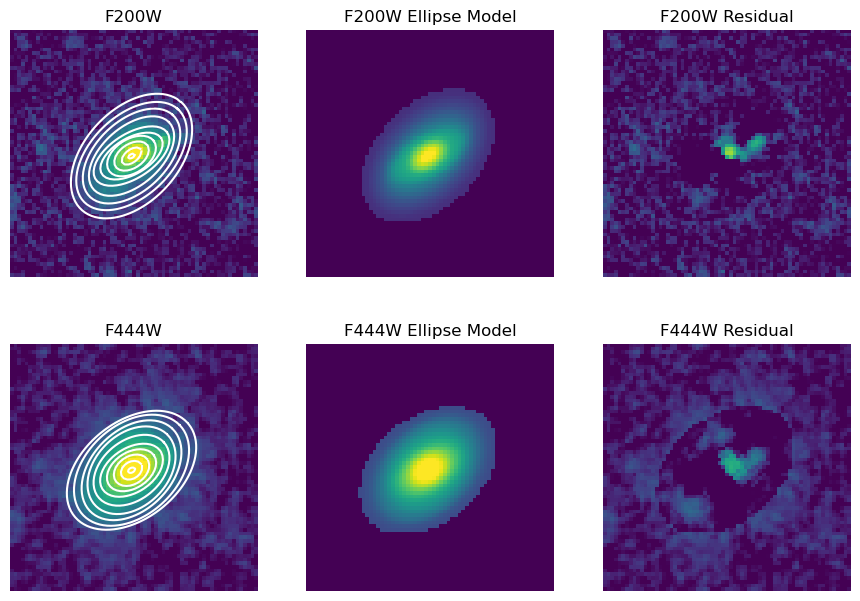

In [10]:
gal=gal_list[1]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[1].x0, geometry[1].y0), geometry[1].sma, 
                          geometry[1].sma*(1-geometry[1].eps),geometry[1].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[1])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.mean(isolist_F444W.x0), y0=np.mean(isolist_F444W.y0), sma=6, eps=0.3, 
                         pa=30.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, geometry_2.sma*(1-geometry_2.eps),
                              geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1, sma0=10)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(-100,100)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

## 3 - ID: 203821

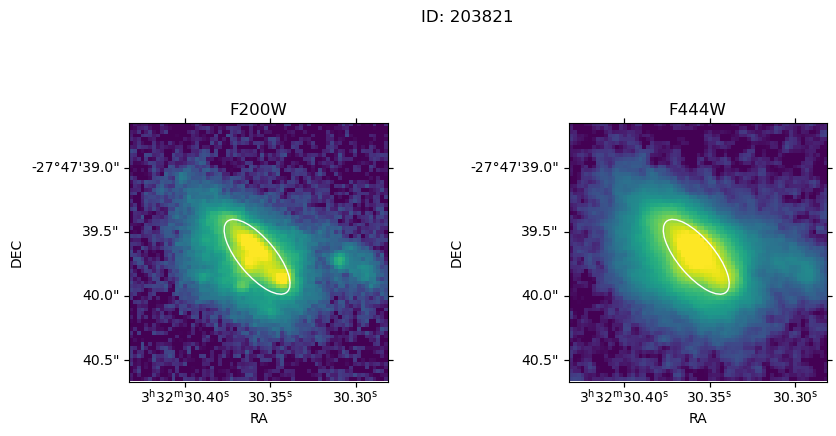

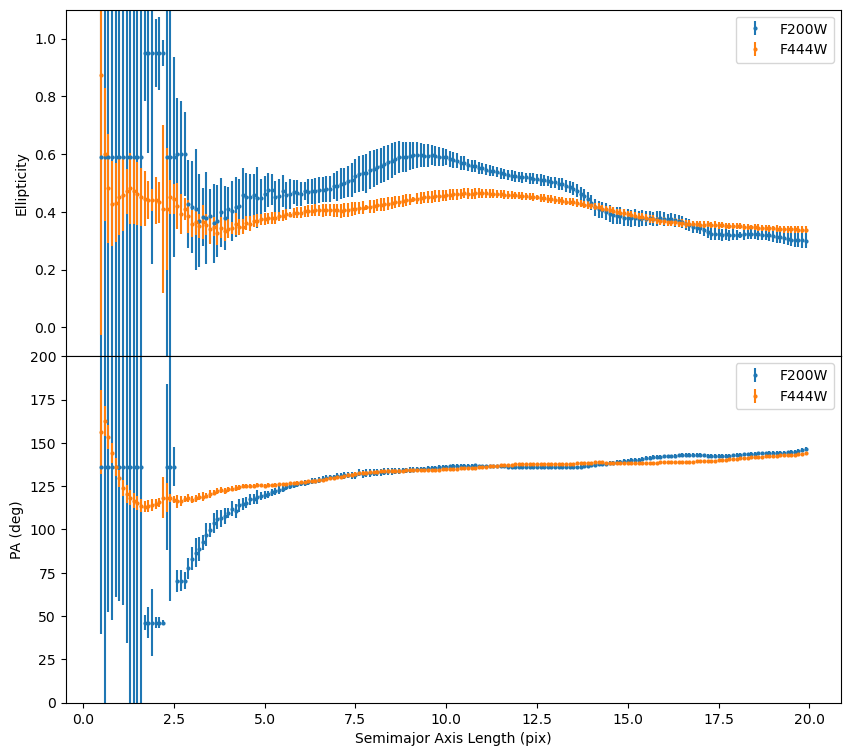

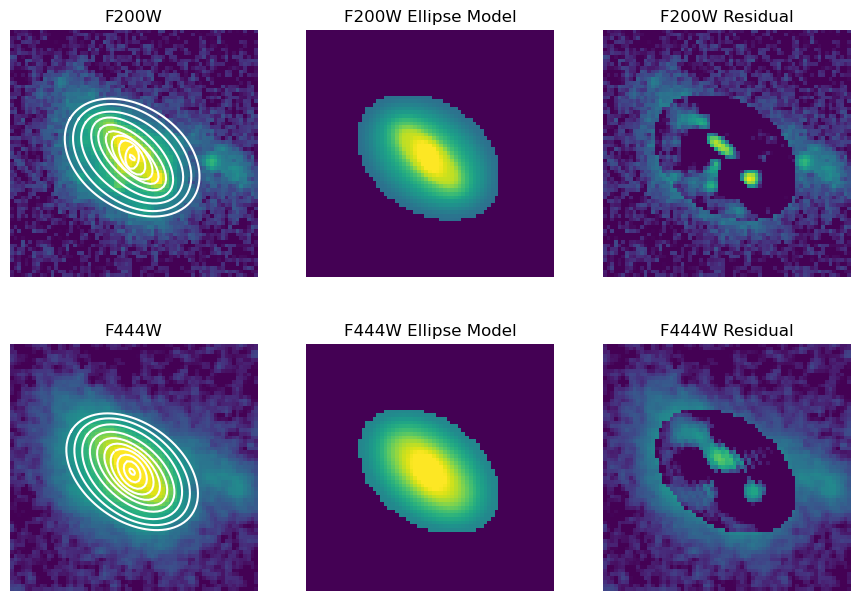

In [11]:
gal=gal_list[2]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[2].x0, geometry[2].y0), geometry[2].sma, 
                          geometry[2].sma*(1-geometry[2].eps),geometry[2].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[2])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.mean(isolist_F444W.x0), y0=np.mean(isolist_F444W.y0), 
                           sma=12, eps=0.6, pa=130.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, geometry_2.sma*(1-geometry_2.eps),
                              geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1, sma0=10)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(0,200)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

## 4 - ID: 203899

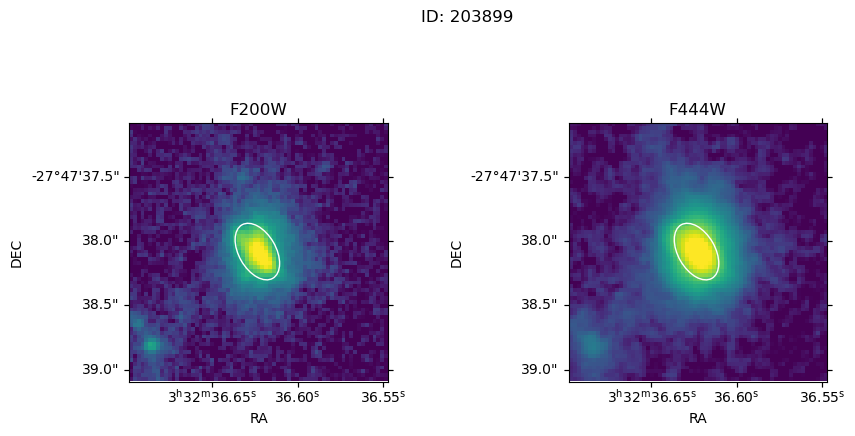

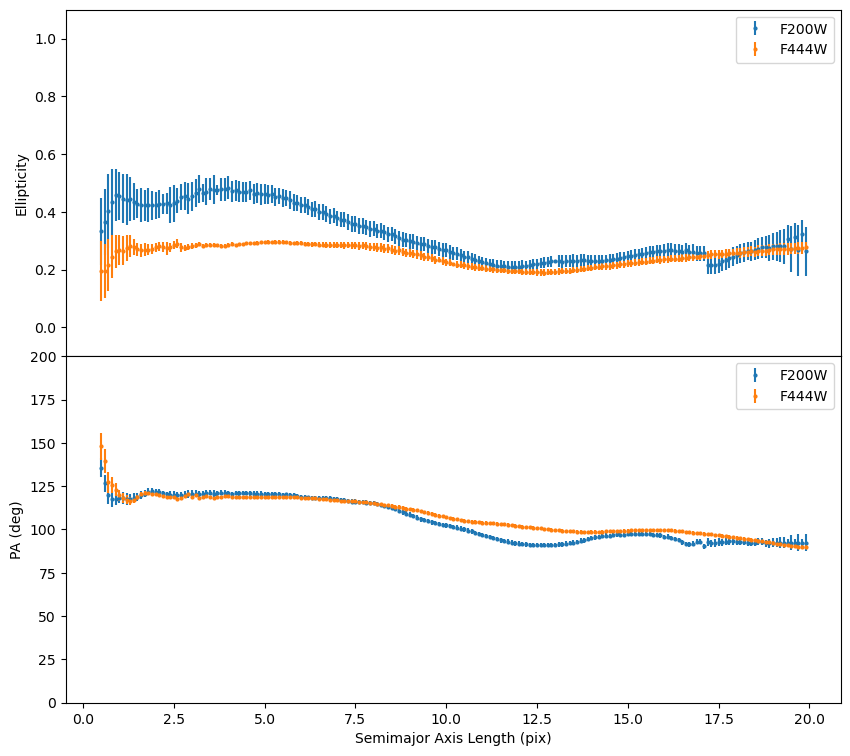

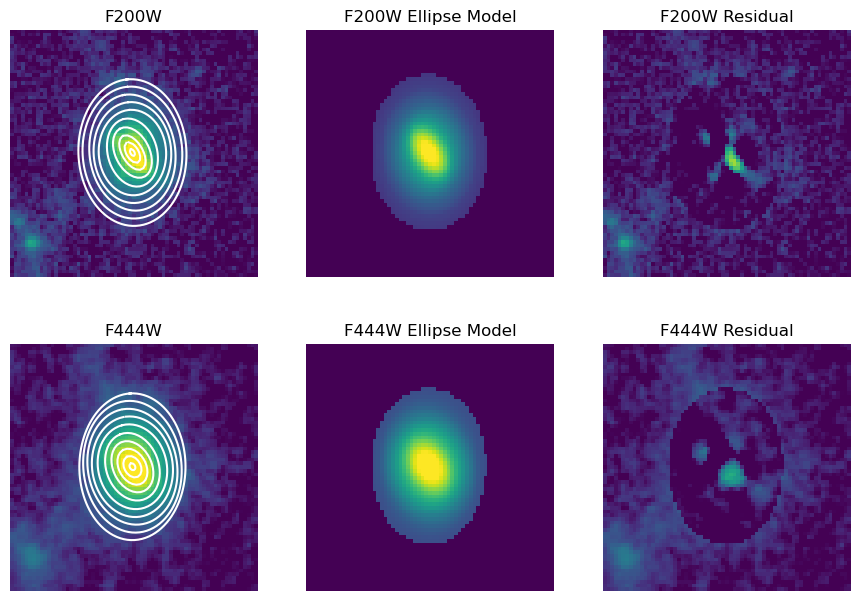

In [12]:
gal=gal_list[3]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[3].x0, geometry[3].y0), geometry[3].sma, 
                          geometry[3].sma*(1-geometry[3].eps),geometry[3].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[3])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.mean(isolist_F444W.x0), y0=np.mean(isolist_F444W.y0), 
                           sma=8, eps=0.4, pa=120.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, geometry_2.sma*(1-geometry_2.eps),
                              geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1, sma0=10)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(0,200)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

## 5 - ID: 210885

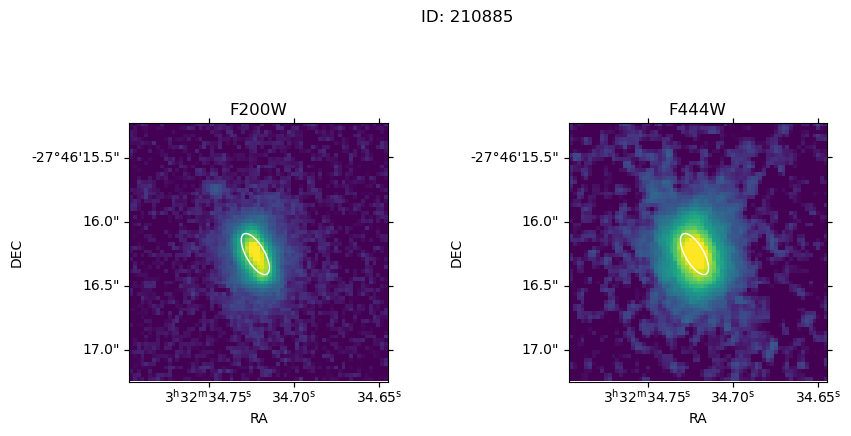

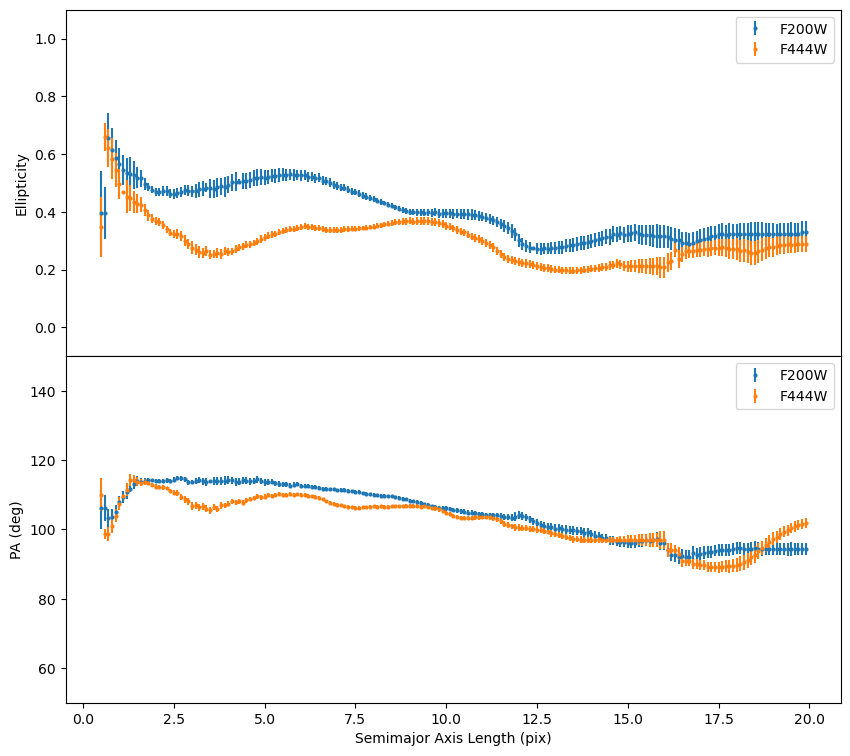

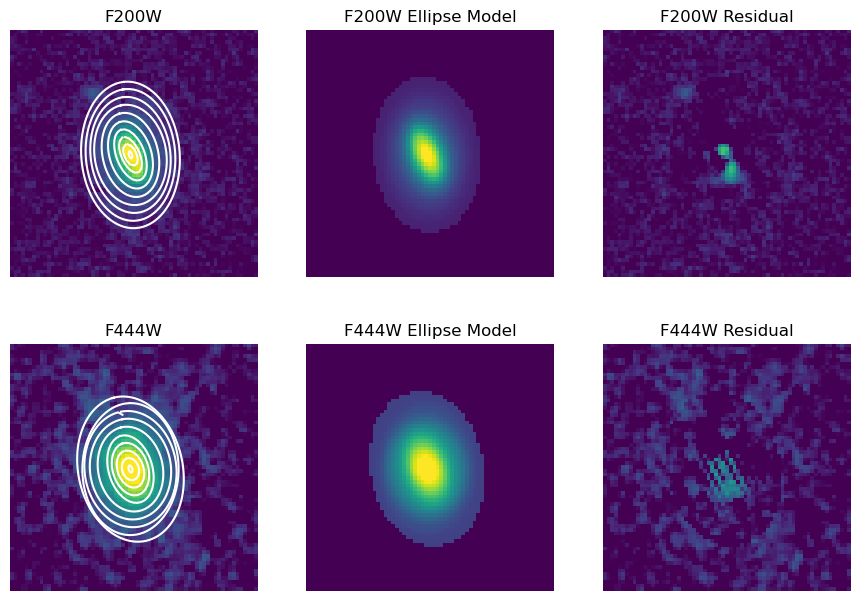

In [13]:
n=4
gal=gal_list[n]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[n].x0, geometry[n].y0), geometry[n].sma, 
                          geometry[n].sma*(1-geometry[n].eps),geometry[n].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[n])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.mean(isolist_F444W.x0), y0=np.mean(isolist_F444W.y0), 
                           sma=6, eps=0.6, pa=120.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, 
                              geometry_2.sma*(1-geometry_2.eps), geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1, sma0=10)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(50,150)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

## 6 - ID: 155468

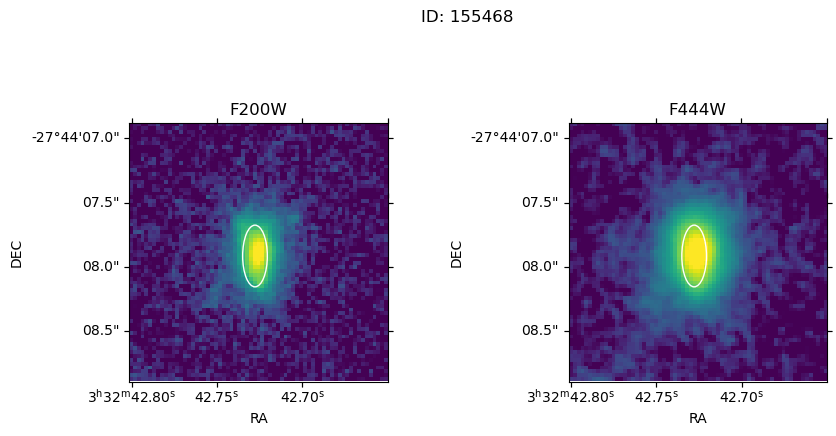

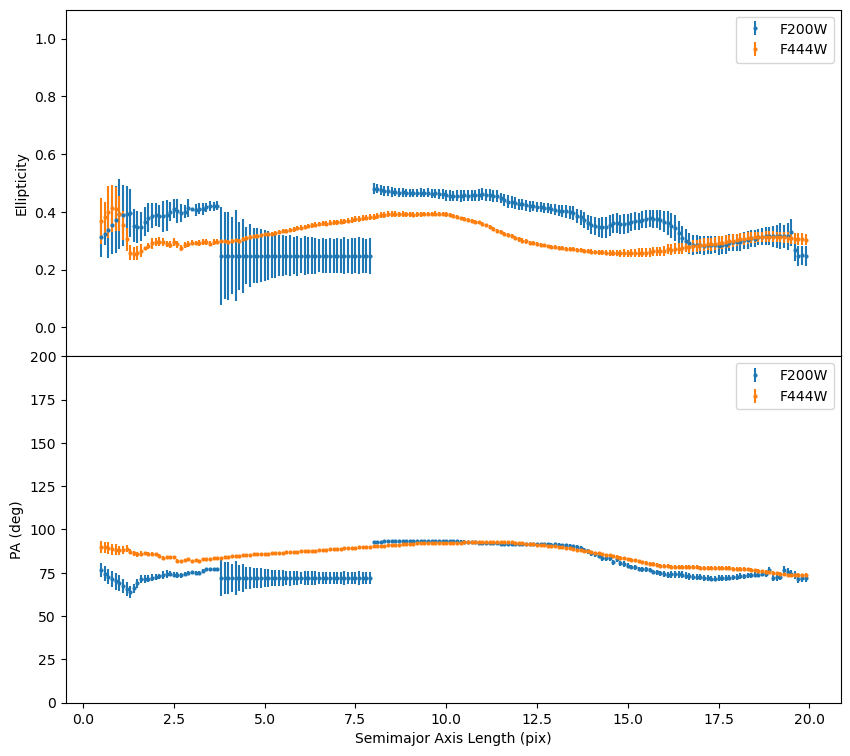

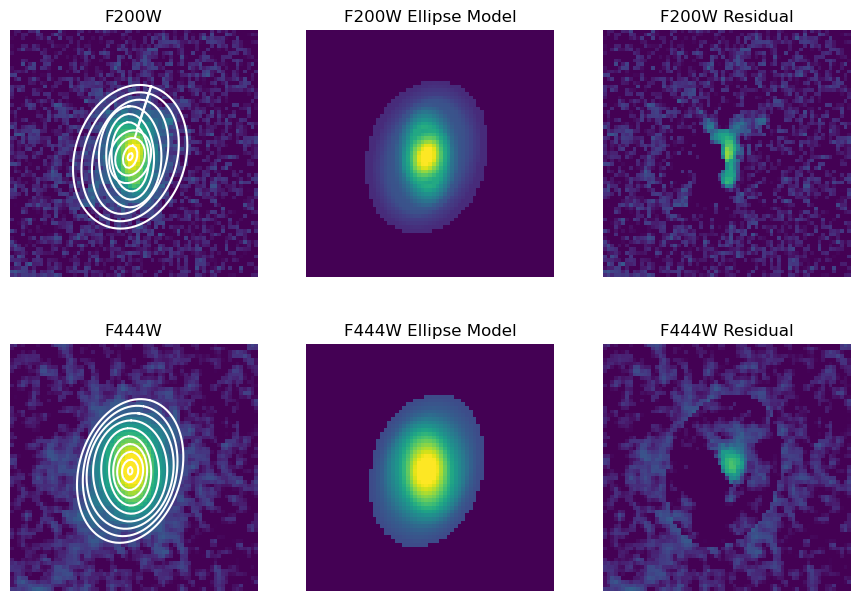

In [14]:
n=5
gal=gal_list[n]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[n].x0, geometry[n].y0), geometry[n].sma, 
                          geometry[n].sma*(1-geometry[n].eps),geometry[n].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[n])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.mean(isolist_F444W.x0), y0=np.mean(isolist_F444W.y0), 
                           sma=8, eps=0.6, pa=90.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, geometry_2.sma*(1-geometry_2.eps),
                              geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(0,200)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

## 7 - ID: 182126

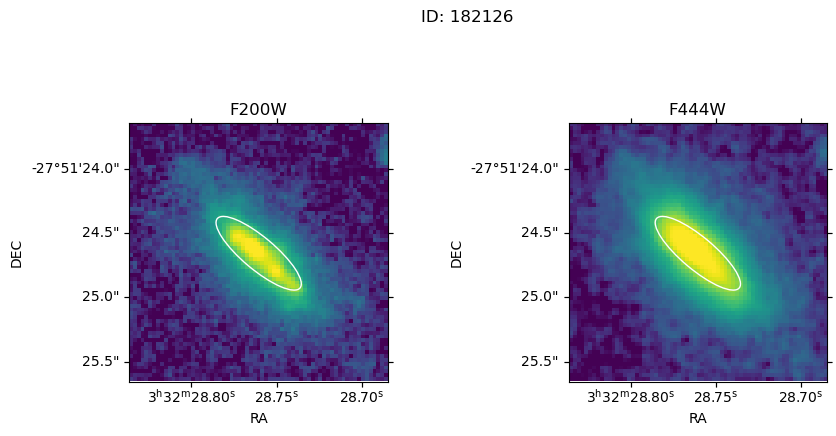

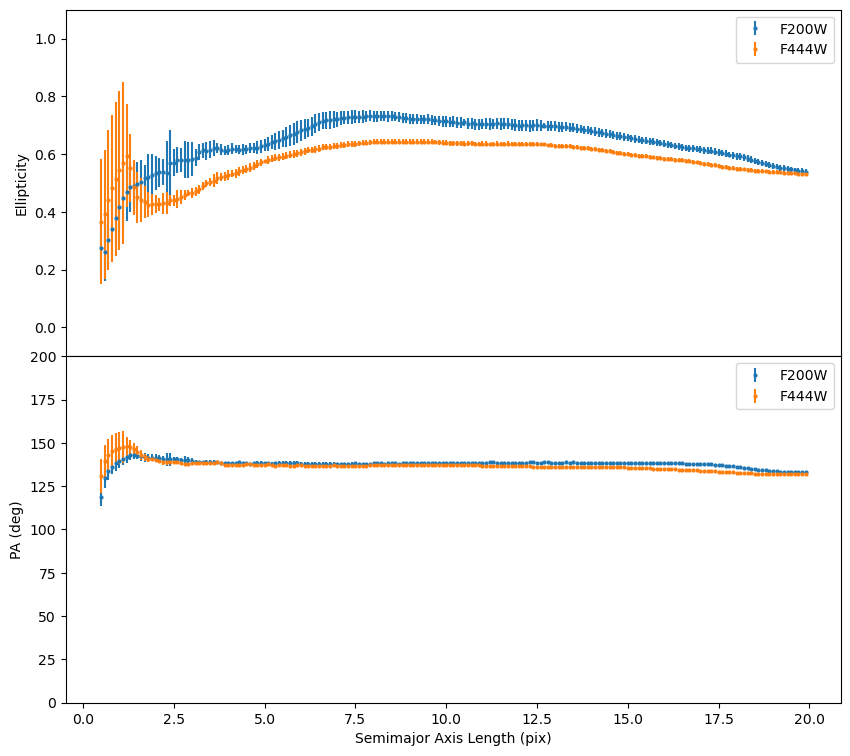

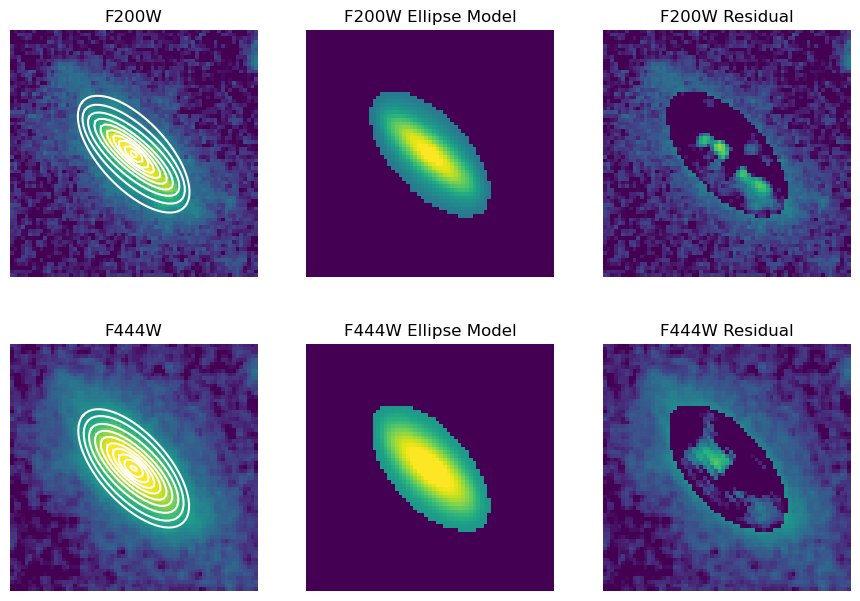

In [15]:
n=6
gal=gal_list[n]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[n].x0, geometry[n].y0), geometry[n].sma, 
                          geometry[n].sma*(1-geometry[n].eps),geometry[n].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[n])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.mean(isolist_F444W.x0), y0=np.mean(isolist_F444W.y0), 
                           sma=14, eps=0.7, pa=140.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, geometry_2.sma*(1-geometry_2.eps),
                              geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(0,200)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

## 8 - ID: 171816

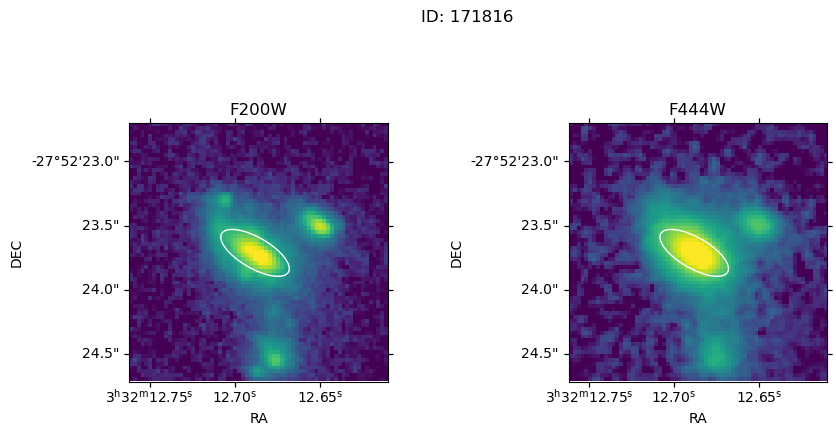

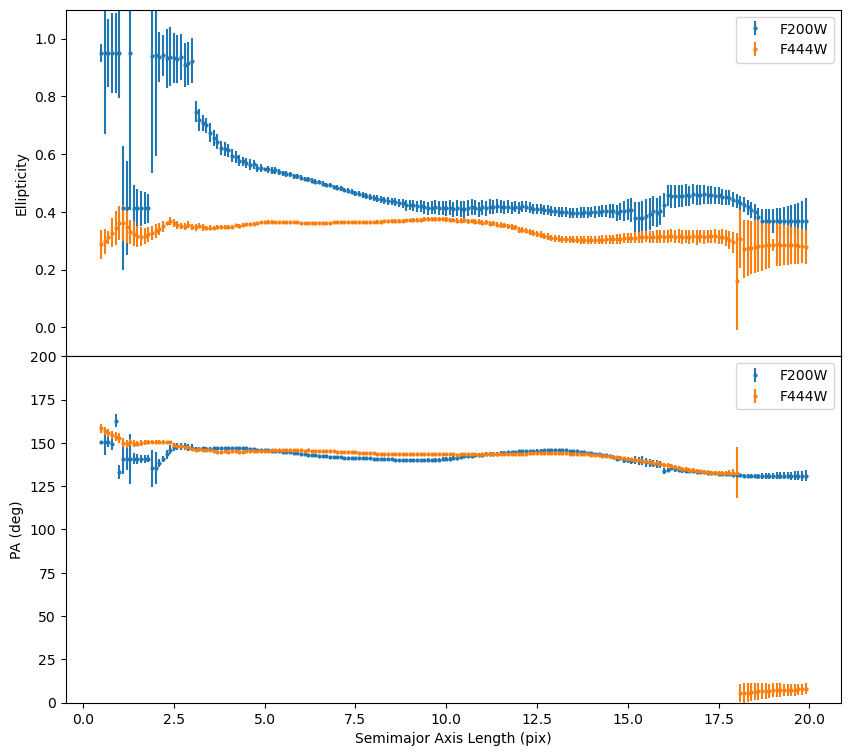

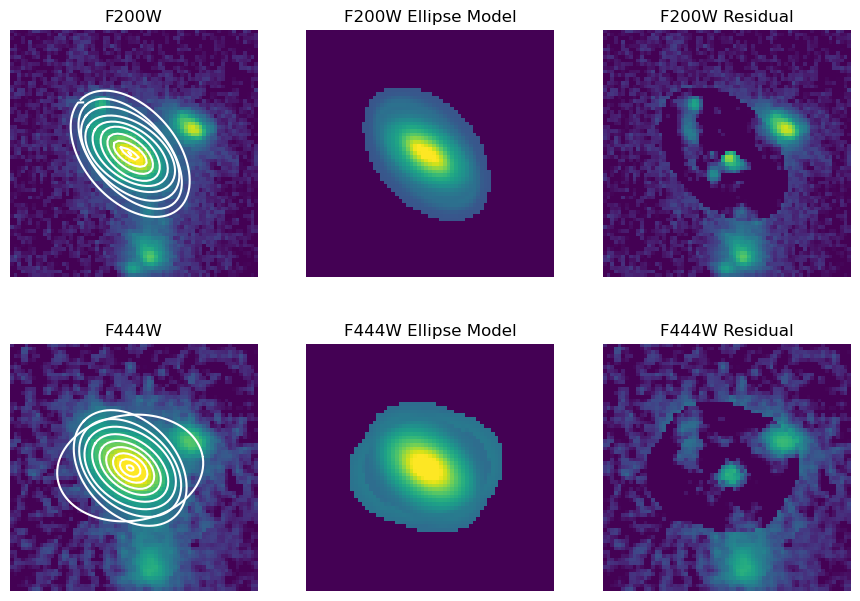

In [16]:
n=7
gal=gal_list[n]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[n].x0, geometry[n].y0), geometry[n].sma, 
                          geometry[n].sma*(1-geometry[n].eps),geometry[n].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[n])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.mean(isolist_F444W.x0), y0=np.mean(isolist_F444W.y0), 
                           sma=10, eps=0.6, pa=150.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, 
                              geometry_2.sma*(1-geometry_2.eps), geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(0,200)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

## 9 - ID: 183012

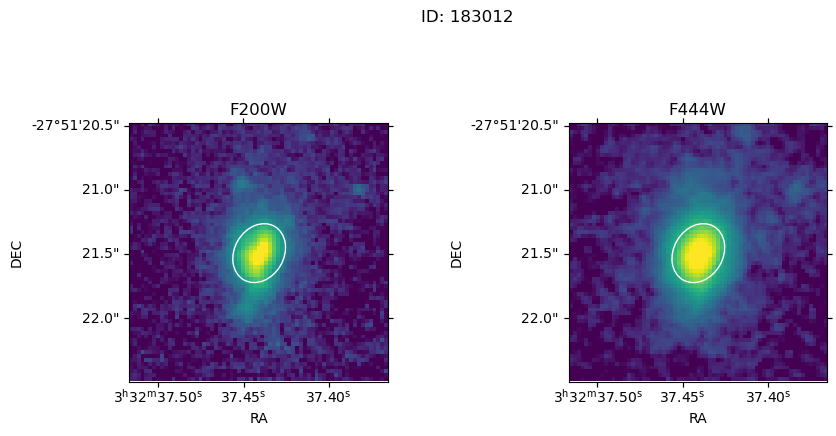

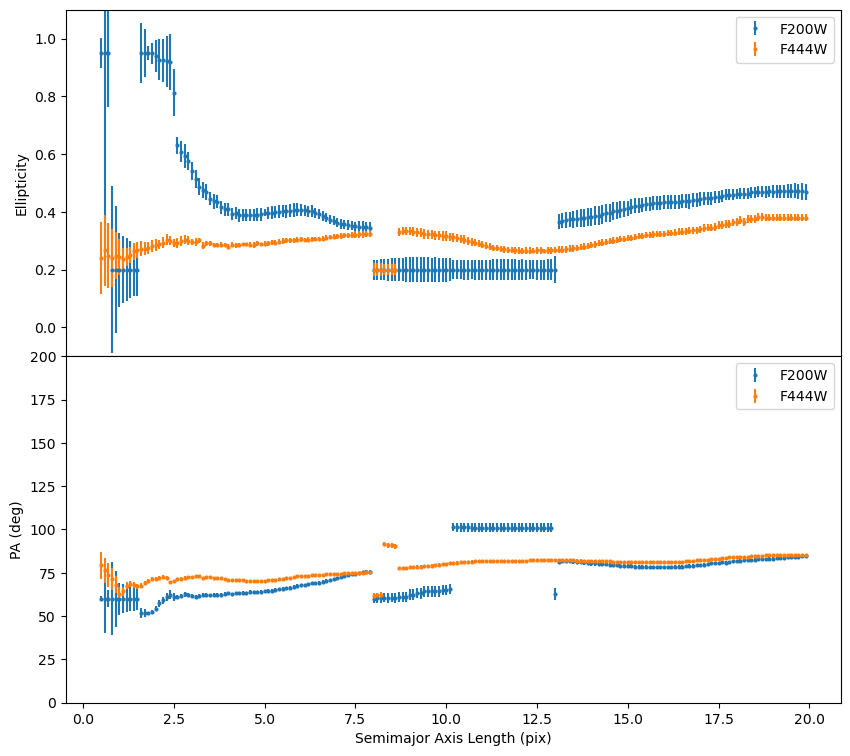

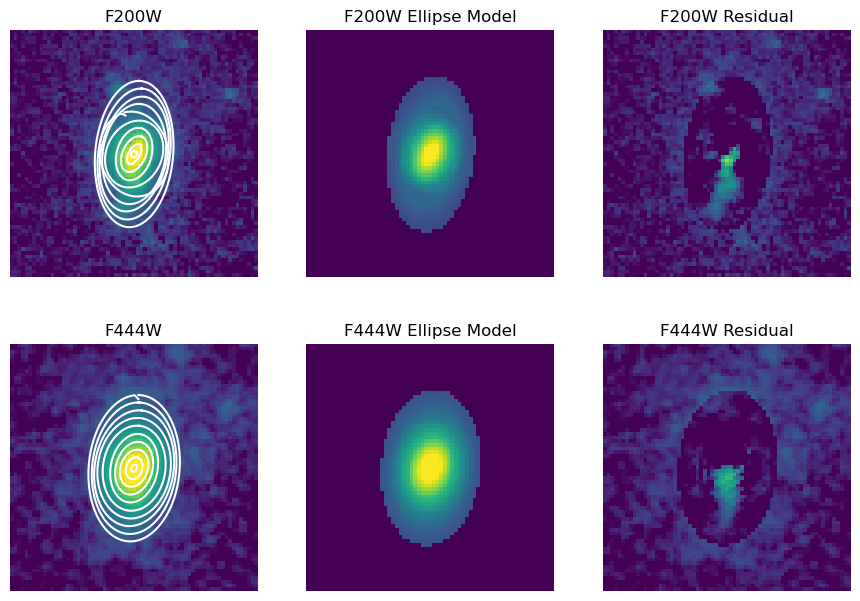

In [17]:
n=8
gal=gal_list[n]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[n].x0, geometry[n].y0), geometry[n].sma, 
                          geometry[n].sma*(1-geometry[n].eps),geometry[n].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[n])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.mean(isolist_F444W.x0), y0=np.mean(isolist_F444W.y0), 
                           sma=8, eps=0.2, pa=60.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, 
                              geometry_2.sma*(1-geometry_2.eps), geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(0,200)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

## 10 - ID: 210751

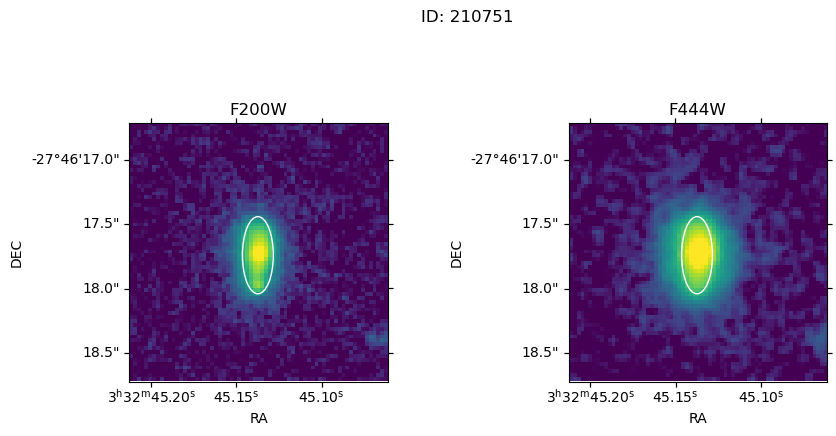

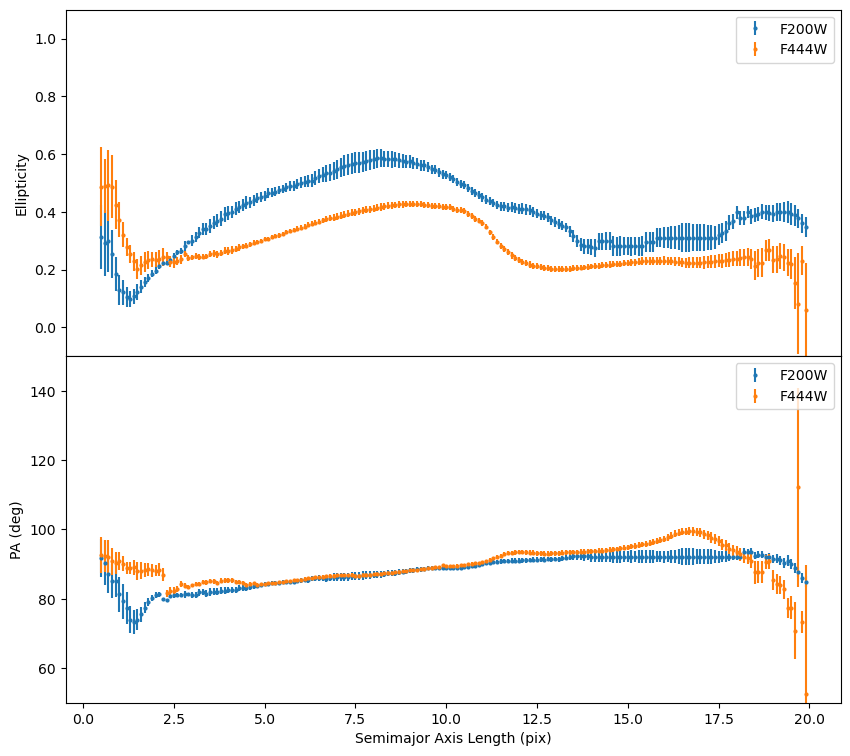

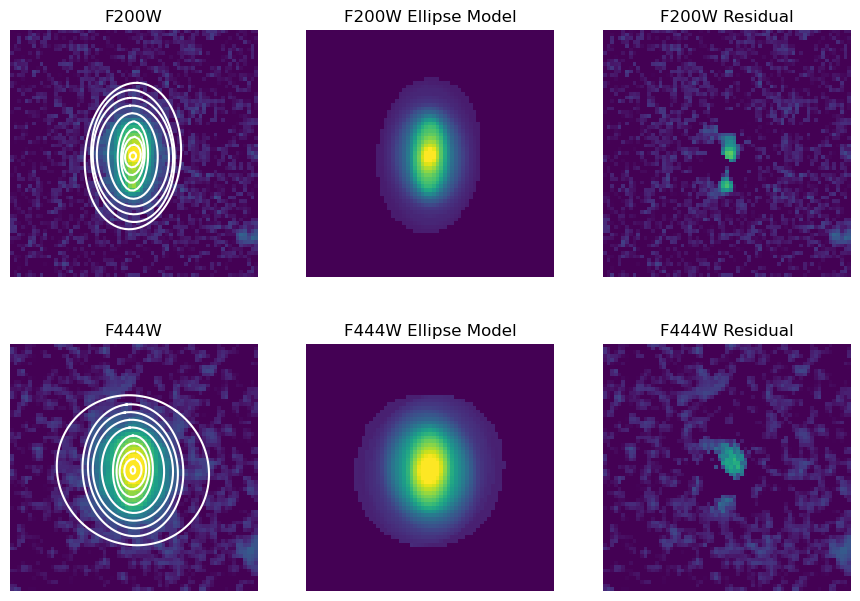

In [18]:
n=9
gal=gal_list[n]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[n].x0, geometry[n].y0), geometry[n].sma, 
                          geometry[n].sma*(1-geometry[n].eps),geometry[n].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[n])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.mean(isolist_F444W.x0), y0=np.mean(isolist_F444W.y0), 
                           sma=10, eps=0.6, pa=90.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, 
                              geometry_2.sma*(1-geometry_2.eps), geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(50,150)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

## 11 - ID: 82863

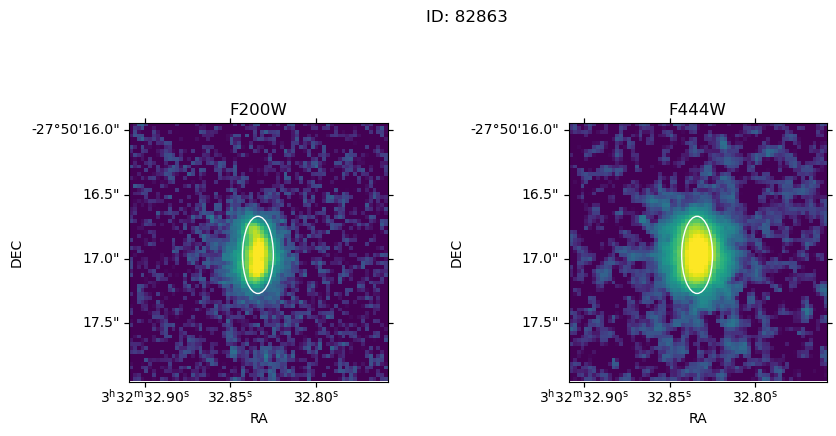

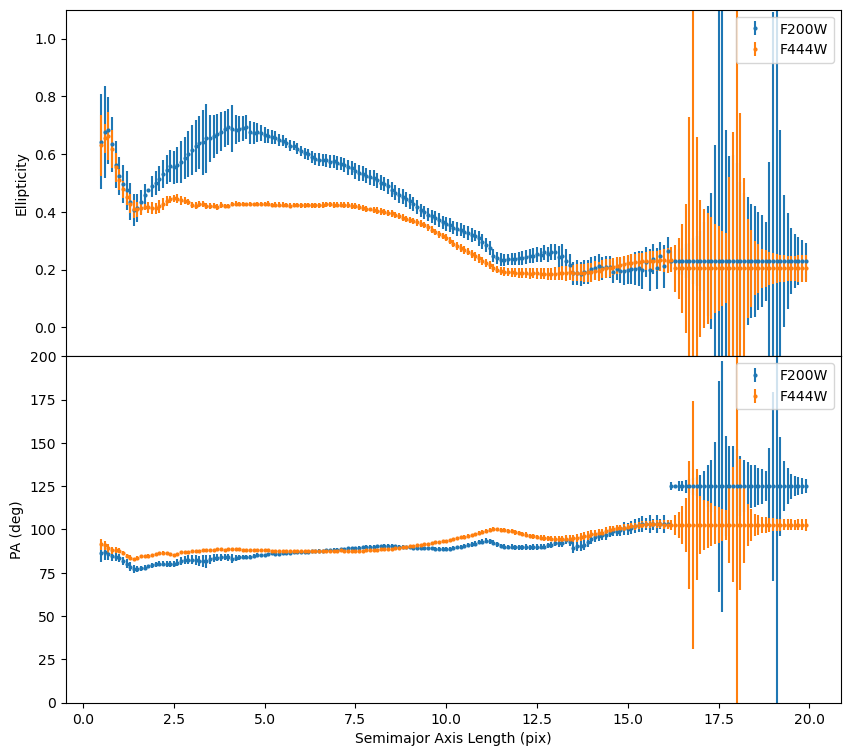

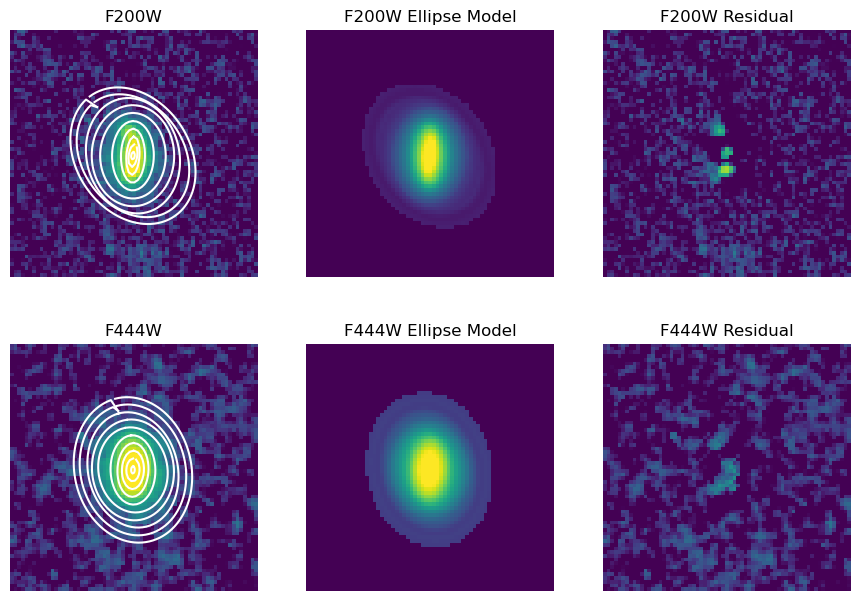

In [19]:
n=10
gal=gal_list[n]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[n].x0, geometry[n].y0), geometry[n].sma, 
                          geometry[n].sma*(1-geometry[n].eps),geometry[n].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[n])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.mean(isolist_F444W.x0), y0=np.mean(isolist_F444W.y0), 
                           sma=10, eps=0.6, pa=90.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, 
                              geometry_2.sma*(1-geometry_2.eps), geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(0,200)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

## 12 - ID: 187340

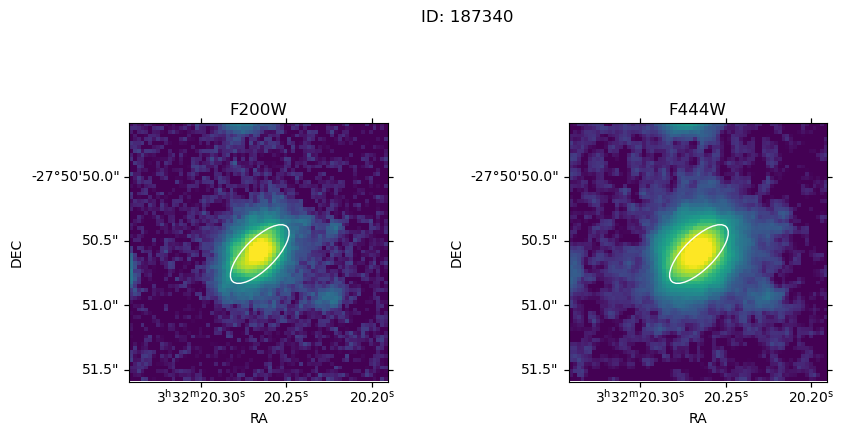

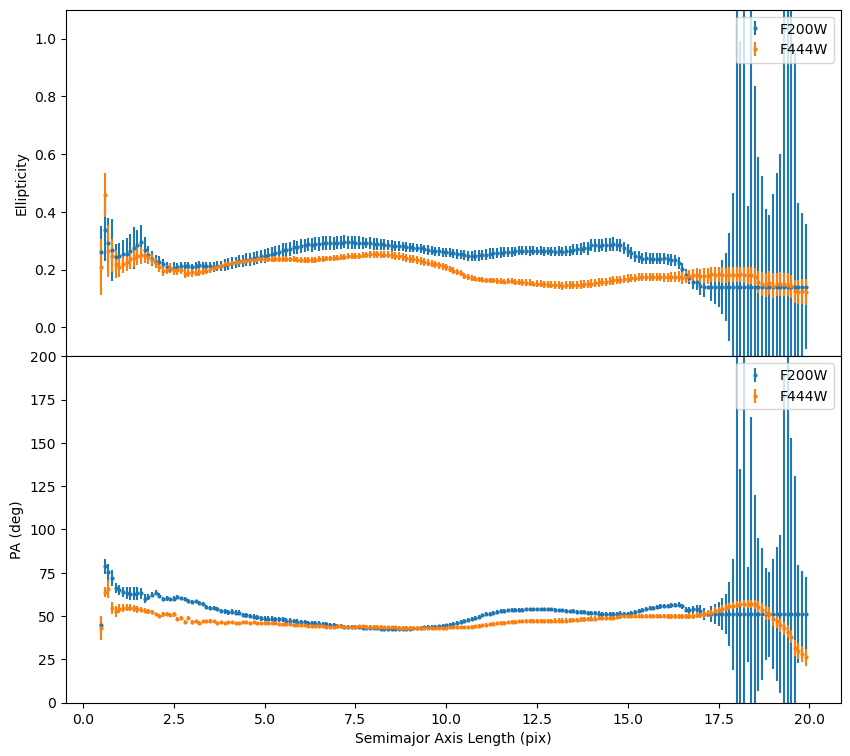

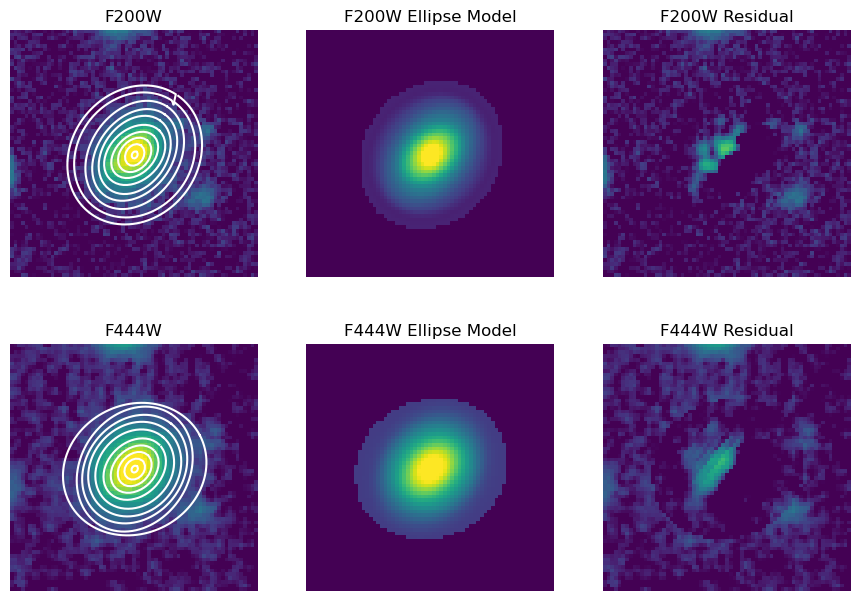

In [20]:
n=11
gal=gal_list[n]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[n].x0, geometry[n].y0), geometry[n].sma, 
                          geometry[n].sma*(1-geometry[n].eps),geometry[n].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[n])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.mean(isolist_F444W.x0), y0=np.mean(isolist_F444W.y0), 
                           sma=10, eps=0.6, pa=45.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, 
                              geometry_2.sma*(1-geometry_2.eps), geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(0,200)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

## 13 - ID: 175485

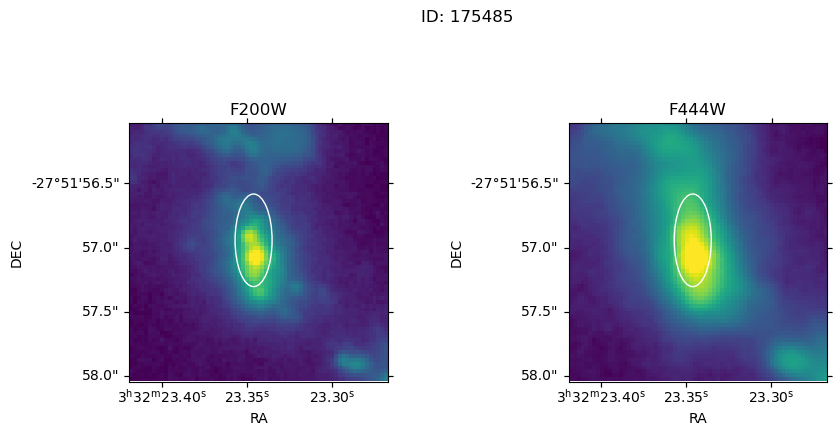

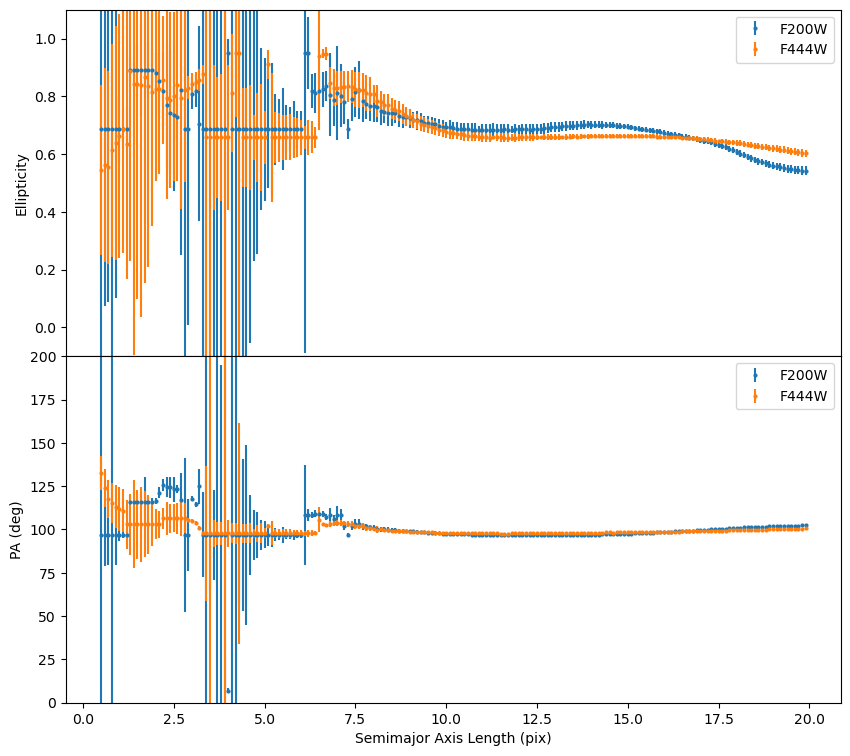

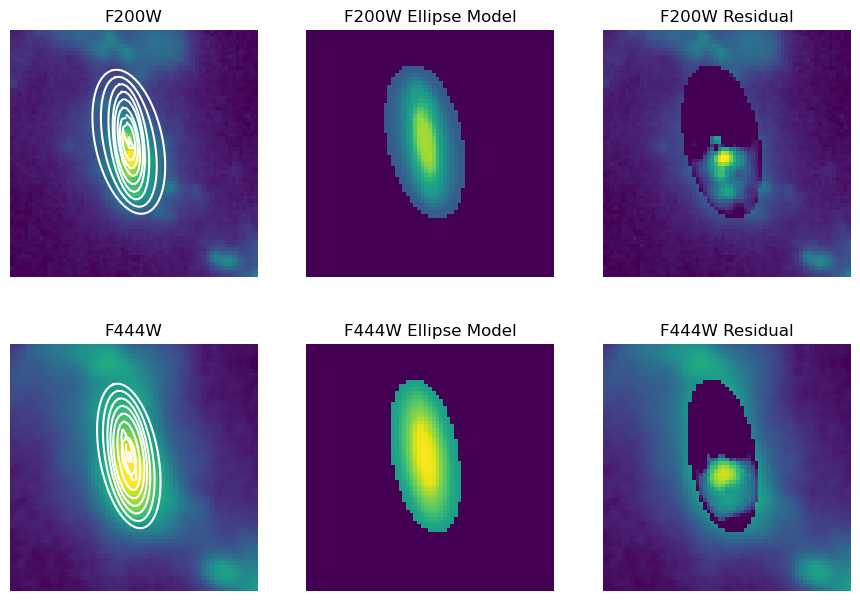

In [21]:
n=12
gal=gal_list[n]

#galaxy in both filters:
image_F200W=cuts_dir_F200W+f"{gal}_cutout.fits"
image_F444W=cuts_dir_F444W+f"{gal}_cutout.fits"
hdu_image_F200W=fits.open(image_F200W)
hdu_image_F444W=fits.open(image_F444W)
data_F200W=hdu_image_F200W[1].data
data_F444W=hdu_image_F444W[1].data
        
#coordinates for the image:
coord=WCS(hdu_image_F200W[1].header)
        
#Plotting the initial ellipse guess:
        
#aperture for both filters:
aper = EllipticalAperture((geometry[n].x0, geometry[n].y0), geometry[n].sma, 
                          geometry[n].sma*(1-geometry[n].eps),geometry[n].pa)
        
#ellipse fit:
ellipse_F444W = Ellipse(data_F444W, geometry[n])
isolist_F444W = ellipse_F444W.fit_image(fix_center = False, linear=True)
##fix_center is False because we're analyzing how it changes to find the best center

#updating geometry:
geometry_2=EllipseGeometry(x0=np.median(isolist_F444W.x0), y0=np.median(isolist_F444W.y0), 
                           sma=12, eps=0.6, pa=90.0 * np.pi / 180.0)

with PdfPages(res_dir+f'{gal}_isophotal_analysis.pdf') as pdf:

    #FIRST PAGE: Galaxy in F200W and F444W filters with initial ellipse guess to fit
        
    #Plotting the second initial ellipse guess:
        
    #aperture for both filters:
    aper = EllipticalAperture((geometry_2.x0, geometry_2.y0), geometry_2.sma, 
                              geometry_2.sma*(1-geometry_2.eps), geometry_2.pa)
        
    #normalization of both images:
    img_max_F200W=0.6*np.max(data_F200W)
    img_max_F444W=0.6*np.max(data_F444W)
    norm_F200W = simple_norm(data_F200W, 'log', log_a=70, min_cut=0, max_cut=img_max_F200W)
    norm_F444W = simple_norm(data_F444W, 'log', log_a=70, min_cut=0, max_cut=img_max_F444W)
        
    #plotting:
    fig=plt.figure(figsize=(9, 5))
    fig.suptitle(f'ID: {gal}')
    plt.subplots_adjust(hspace=0, wspace=0.7)
        
    plt.subplot(1, 2, 1, projection=coord)
    plt.imshow(data_F200W, origin='lower',norm=norm_F200W)
    plt.title("F200W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    plt.subplot(1, 2, 2, projection=coord)
    plt.imshow(data_F444W, origin='lower',norm=norm_F444W)
    plt.title("F444W")
    plt.xlabel('RA')
    plt.ylabel('DEC')
    aper.plot(color='white')
        
    pdf.savefig(bbox_inches="tight")

        
    #SECOND PAGE: Graphs on semimajor axis vs ellipticity and semimajor axis vs position angle

    ellipse_F200W = Ellipse(data_F200W, geometry_2)
    isolist_F200W = ellipse_F200W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    ellipse_F444W = Ellipse(data_F444W, geometry_2)
    isolist_F444W = ellipse_F444W.fit_image(fix_center = True, linear=True, minsma=0.1, maxsma=20, 
                                            conver=0.1, maxgerr=0.95, step=0.1)
        
    plt.figure(figsize=(10, 9))
    plt.subplots_adjust(hspace=0, wspace=0.35)
        
    plt.subplot(2, 1, 1)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.eps, yerr=isolist_F200W.ellip_err, fmt='o', 
                     markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.eps, yerr=isolist_F444W.ellip_err, fmt='o', 
                     markersize=2, label='F444W')
    plt.ylabel('Ellipticity')
    plt.legend()
    plt.ylim(-0.1,1.1)
        
    plt.subplot(2, 1, 2)
    plt.errorbar(isolist_F200W.sma, isolist_F200W.pa/np.pi*180.0, yerr=isolist_F200W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F200W')
    plt.errorbar(isolist_F444W.sma, isolist_F444W.pa/np.pi*180.0, yerr=isolist_F444W.pa_err/np.pi*80.0,
                     fmt='o', markersize=2, label='F444W')
    plt.xlabel('Semimajor Axis Length (pix)')
    plt.ylabel('PA (deg)')
    plt.legend()
    plt.ylim(0,200)
        
    pdf.savefig(bbox_inches="tight")

        
    #THIRD PAGE: data, model and residuals

    #models and residuals:
    model_image_F200W = build_ellipse_model(data_F200W.shape, isolist_F200W)
    residual_F200W = data_F200W - model_image_F200W
    model_image_F444W = build_ellipse_model(data_F444W.shape, isolist_F444W)
    residual_F444W = data_F444W - model_image_F444W
        
    fig, axs = plt.subplots(figsize=(6, 6), nrows=2, ncols=3)
    fig.subplots_adjust(left=0.1, right=1.5, bottom=0.02, top=0.98)
        
    axs[0][0].imshow(data_F200W, origin='lower',norm=norm_F200W)
    axs[0][0].set_title('F200W')
    axs[0][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F200W = isolist_F200W.get_closest(sma)
        x_F200W, y_F200W, = iso_F200W.sampled_coordinates()
        axs[0][0].plot(x_F200W, y_F200W, color='white')
        
    axs[0][1].imshow(model_image_F200W, origin='lower',norm=norm_F200W)
    axs[0][1].set_title('F200W Ellipse Model')
    axs[0][1].axis('off')
        
    axs[0][2].imshow(residual_F200W, origin='lower',norm=norm_F200W)
    axs[0][2].set_title('F200W Residual')
    axs[0][2].axis('off')
        
    axs[1][0].imshow(data_F444W, origin='lower',norm=norm_F444W)
    axs[1][0].set_title('F444W')
    axs[1][0].axis('off')
        
    smas = np.linspace(1, 20, 10)
    for sma in smas:
        iso_F444W = isolist_F444W.get_closest(sma)
        x_F444W, y_F444W, = iso_F444W.sampled_coordinates()
        axs[1][0].plot(x_F444W, y_F444W, color='white')
        
    axs[1][1].imshow(model_image_F444W, origin='lower',norm=norm_F444W)
    axs[1][1].set_title('F444W Ellipse Model')
    axs[1][1].axis('off')
        
    axs[1][2].imshow(residual_F444W, origin='lower',norm=norm_F444W)
    axs[1][2].set_title('F444W Residual')
    axs[1][2].axis('off')

        
    pdf.savefig(bbox_inches="tight")

In [24]:
time_end = datetime.now()
print(f"Initial time...: {time_ini}")
print(f"Final time.....: {time_end}")
print(f"Excecution time: {time_end-time_ini}")

Initial time...: 2024-01-18 22:28:28.852127
Final time.....: 2024-01-18 22:56:45.915911
Excecution time: 0:28:17.063784
